# Libraries

# Problem Defintion

    We want to analyze the historical data on electric vehicle charging sessions to understand the trends and patterns in power demand. Our goal is to forecast future power demand based on historical patterns and to identify the key factors that influence power demand

In [1]:
#Importing the necessary libraries
import math
import numpy as np
import pandas as pd
import datetime as dt
import os
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
import matplotlib as mpl
from matplotlib import colors as mcolors
colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
import statsmodels.api as sm
import warnings
import matplotlib.dates as mdates
from pandas.plotting import lag_plot, autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 
from sklearn.feature_selection import VarianceThreshold
import geopandas as gpd
from shapely import wkt

# Import necessary libraries
from statsmodels.tsa.seasonal import seasonal_decompose

In [2]:
# FE / ML Libraries
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.linear_model import LinearRegression
from category_encoders import OneHotEncoder, OrdinalEncoder, TargetEncoder, BinaryEncoder, CatBoostEncoder, HelmertEncoder, SumEncoder
from sklearn.model_selection import cross_val_score, KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import f_classif, f_regression, mutual_info_classif, mutual_info_regression
from numpy import mean
from numpy import std
from sklearn.model_selection import RepeatedStratifiedKFold, RepeatedKFold
from sklearn.feature_selection import RFE



In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Lasso, ElasticNet

In [4]:
import tensorflow as tf

2023-09-21 15:30:10.452033: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-21 15:30:10.518260: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
cwd = os.getcwd()
DATA_PATH = os.path.join(cwd, '..', 'data')
RAW_DATA_PATH = os.path.join(DATA_PATH, 'raw')
PROCESSED_DATA_PATH = os.path.join(DATA_PATH, 'processed')

In [6]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # If there are GPUs available, print a message and enable memory growth
  print("GPU is available")
  for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
else:
  print("GPU is not available")

print(tf.config.list_physical_devices('GPU'))

GPU is not available
[]


# OSM distance-based analysis

# Loading the OSM Distance Data

In [7]:
def load_gdf_from_csv(year, directory):
    path = os.path.join(directory, '..', 'data', 'interim', f'osm_distances_{year}_counted.csv')
    gdf = pd.read_csv(path)
    # If you saved the files with geometry information in GeoJSON, you would use geopandas.read_file(path)
    print(f"Loaded {year}.csv")
    return gdf

# Usage
cwd = os.getcwd()
df_2016 = load_gdf_from_csv(2016, cwd)
df_2017 = load_gdf_from_csv(2017, cwd)
df_2018 = load_gdf_from_csv(2018, cwd)
df_2019 = load_gdf_from_csv(2019, cwd)


Loaded 2016.csv
Loaded 2017.csv
Loaded 2018.csv
Loaded 2019.csv


In [8]:
df_2016.head()

,Unnamed: 0,CP ID,Connector,Total kWh,Site,Model,Site_encoded,Model_encoded,geometry,name,...,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance
0,0,50993,2,19.170,King Street Car Park,APT Triple Rapid Charger,11.0,3.0,POINT (-1.8542879425490655 53.723597749999996),Scotland,...,1.0,3.204423,485.0,3.555824,9.0,3.814511,37.0,3.098948,45.0,3.254722
1,1,51261,2,5.713,Market Square Alyth,APT 22kW Dual Outlet,16.0,0.0,POINT (-3.230287568366979 56.6225313),Scotland,...,1.0,1.271231,485.0,1.453133,9.0,1.525432,37.0,1.112991,45.0,1.091934
2,2,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,...,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958
3,3,50275,1,10.210,Perth & Kinross Council - Friarton Depot,APT 7kW Dual Outlet,9.0,2.0,POINT (-3.4239012108677493 56.37659640296878),Scotland,...,1.0,0.971844,485.0,1.303907,9.0,1.483782,37.0,0.969369,45.0,0.969064
4,4,50575,1,10.966,South Inch Car Park,APT Triple Rapid Charger,20.0,3.0,POINT (-3.427360729721281 56.39154009919279),Scotland,...,1.0,0.977016,485.0,1.306424,9.0,1.483753,37.0,0.975074,45.0,0.972219


In [9]:
def data_wetaher():
    data_path = os.path.join(DATA_PATH, 'interim', 'weather', 'df_weather_hourly.csv') #,parse_dates=[['Date', 'Hour']]) if date and hour to be merged here.
    data = pd.read_csv(data_path)

    # Drop 'Unnamed' columns
    data = data.loc[:, ~data.columns.str.contains('^Unnamed')]
    data = data.loc[:, ~data.columns.str.contains('Total kWh.1')]
    return data
data = data_wetaher()
# Display all columns
pd.set_option('display.max_columns', None)
data.head()

,Date_Hour,Start DateTime,CP ID,Connector,Total kWh,Site,Model,End DateTime,Site_encoded,Model_encoded,geometry,name,datetime,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations
0,2016-01-09 07:00:00,2016-01-09 07:21:00,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-09 07:27:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-09 07:00:00,-1.4,-1.4,-1.4,99.90,0.0,0,NaN,0.0,2.00,NaN,0.2,354,990.9,98.4,1.0,0.0,0.0,0,NaN,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999..."
1,2016-01-09 07:00:00,2016-01-09 07:51:00,50281,2,3.870,"Rie-Achan Road Car Park, Pitlochry",APT 22kW Dual Outlet,2016-01-09 09:01:00,19.0,0.0,POINT (-3.738820533577715 56.7034231),Scotland,2016-01-09 07:00:00,-1.4,-1.4,-1.4,99.90,0.0,0,NaN,0.0,2.00,NaN,0.2,354,990.9,98.4,1.0,0.0,0.0,0,NaN,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999..."
2,2016-01-09 08:00:00,2016-01-09 08:22:00,50285,1,13.930,Broxden Park & Ride,APT 22kW Dual Outlet,2016-01-09 14:32:00,3.0,0.0,POINT (-3.4777460635074835 56.386610000000005),Scotland,2016-01-09 08:00:00,-1.4,-1.4,-1.5,99.52,0.0,0,NaN,0.0,2.00,NaN,0.2,354,989.9,98.9,1.4,0.7,0.0,0,NaN,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999..."
3,2016-01-09 08:00:00,2016-01-09 08:54:00,50281,1,10.380,"Rie-Achan Road Car Park, Pitlochry",APT 22kW Dual Outlet,2016-01-09 16:37:00,19.0,0.0,POINT (-3.738820533577715 56.7034231),Scotland,2016-01-09 08:00:00,-1.4,-1.4,-1.5,99.52,0.0,0,NaN,0.0,2.00,NaN,0.2,354,989.9,98.9,1.4,0.7,0.0,0,NaN,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999..."
4,2016-01-09 09:00:00,2016-01-09 09:22:00,50745,2,3.580,Kinross Park and Ride,APT Triple Rapid Charger,2016-01-09 09:37:00,13.0,3.0,POINT (-3.432945 56.2067285),Scotland,2016-01-09 09:00:00,-1.1,-1.1,-1.1,99.85,0.0,0,NaN,0.0,1.96,NaN,0.2,1,989.5,97.0,0.7,12.7,0.0,0,NaN,Overcast,fog,"03144099999,03158099999,03166099999,0317109999..."


## 1. Data Integration and Preprocessing
- **Merging of the Datasets**: The time series data frame is combined with the distance-based data frames for each year, allowing analysis of both energy consumption and proximity to various amenities.
- **Handling of Missing Values**: The presence of any missing values is determined, and an appropriate method for handling them is identified.
- **Extraction of Time Features**: Time-based features like year, month, week, and day of the week are extracted from the Start and End DateTime.

In [10]:
def filter_by_year(data, year):
    data['Start DateTime'] = pd.to_datetime(data['Start DateTime'])
    return data[data['Start DateTime'].dt.year == year]

def merge_dataframes(data, yearly_df, year): # Add 'year' as a parameter here
    return pd.merge(data, yearly_df, on=['geometry'], suffixes=('_data', f'_{year}'))

def handle_missing_values(df):
    return df.fillna(0)

def extract_time_features(df):
    df['year'] = df['Start DateTime'].dt.year
    df['month'] = df['Start DateTime'].dt.month
    df['week'] = df['Start DateTime'].dt.isocalendar().week
    df['weekday'] = df['Start DateTime'].dt.weekday
    df['day_of_week'] = df['Start DateTime'].dt.day_name() # Added line to create 'day_of_week' column
    return df

def preprocess_data(data, yearly_dfs):
    final_dfs = []
    for year, yearly_df in zip([2016, 2017, 2018, 2019], yearly_dfs):
        filtered_data = filter_by_year(data, year)
        merged_df = merge_dataframes(filtered_data, yearly_df, year) # Pass 'year' as an argument here
        merged_df = handle_missing_values(merged_df)
        merged_df = extract_time_features(merged_df)
        final_dfs.append(merged_df)
    return final_dfs

# The rest of the code remains the same
directory = os.getcwd() # or specify your directory path here
yearly_dfs = [pd.read_csv(os.path.join(directory, '..', 'data', 'interim', f'osm_distances_{year}_counted.csv')) for year in [2016, 2017, 2018, 2019]]
final_dfs = preprocess_data(data, yearly_dfs)


### The code provided in the function extract_time_features takes a DataFrame df that contains a datetime column Start DateTime and extracts several time-related features from it. Let's go through each line to understand what it's doing:

df['year'] = df['Start DateTime'].dt.year: This extracts the year from the Start DateTime column and assigns it to a new column named year.

df['month'] = df['Start DateTime'].dt.month: This extracts the month (from 1 to 12) from the Start DateTime column and assigns it to a new column named month.

df['week'] = df['Start DateTime'].dt.isocalendar().week: This extracts the ISO week number from the Start DateTime column and assigns it to a new column named week. The ISO week starts on Monday and ends on Sunday.

df['weekday'] = df['Start DateTime'].dt.weekday: This extracts the integer value of the weekday from the Start DateTime column, where Monday is 0 and Sunday is 6, and assigns it to a new column named weekday.

df['day_of_week'] = df['Start DateTime'].dt.day_name(): This extracts the name of the weekday (e.g., "Monday," "Tuesday," etc.) from the Start DateTime column and assigns it to a new column named day_of_week.

Now, let's look at the example DataFrame. Here's how the results for the last five columns are computed for the given rows:

Start DateTime = "2016-01-09 07:21:00"
year = 2016 (the year part of the date)
month = 1 (the month part of the date)
week = 1 (the ISO week number)
weekday = 5 (Saturday is the 5th day when counting from Monday as 0)
day_of_week = "Saturday" (the name of the weekday)
The values for the second row are the same because the Start DateTime is also a Saturday within the same year and month.

In [11]:
df_2016, df_2017, df_2018, df_2019 = final_dfs

In [12]:
type(final_dfs)

list

In [13]:
df_2016.head()

,Date_Hour,Start DateTime,CP ID_data,Connector_data,Total kWh_data,Site_data,Model_data,End DateTime,Site_encoded_data,Model_encoded_data,geometry,name_data,datetime,temp_data,feelslike_data,dew_data,humidity_data,precip_data,precipprob_data,preciptype_data,snow_data,snowdepth_data,windgust_data,windspeed_data,winddir_data,sealevelpressure_data,cloudcover_data,visibility_data,solarradiation_data,solarenergy_data,uvindex_data,severerisk_data,conditions_data,icon_data,stations_data,Unnamed: 0,CP ID_2016,Connector_2016,Total kWh_2016,Site_2016,Model_2016,Site_encoded_2016,Model_encoded_2016,name_2016,temp_2016,feelslike_2016,dew_2016,humidity_2016,precip_2016,precipprob_2016,preciptype_2016,snow_2016,snowdepth_2016,windgust_2016,windspeed_2016,winddir_2016,sealevelpressure_2016,cloudcover_2016,visibility_2016,solarradiation_2016,solarenergy_2016,uvindex_2016,severerisk_2016,conditions_2016,icon_2016,stations_2016,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,day_of_week
0,2016-01-09 07:00:00,2016-01-09 07:21:00,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-09 07:27:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-09 07:00:00,-1.4,-1.4,-1.4,99.90,0.000,0,0,0.0,2.00,0.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",2,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,0.0,3.0,Scotland,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,Saturday
1,2016-01-09 18:00:00,2016-01-09 18:22:00,50994,2,11.150,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-09 19:00:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-09 18:00:00,2.9,-0.1,2.0,94.24,0.633,100,rain,0.0,1.58,0.0,11.2,89,982.3,90.0,18.0,0.0,0.0,0,0.0,"Rain, Partially cloudy",rain,"03144099999,03158099999,03166099999,0317109999...",2,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,0.0,3.0,Scotland,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,Saturday
2,2016-01-11 07:00:00,2016-01-11 07:06:00,50994,1,5.895,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-11 07:57:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-11 07:00:00,2.7,-0.5,0.6,86.38,0.000,0,"rain,snow",0.0,0.00,54.0,12.0,227,976.9,69.4,32.1,0.0,0.0,0,0.0,Partially cloudy,partly-cloudy-night,"03144099999,03158099999,03166099999,0317109999...",2,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,0.0,3.0,Scotland,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,Monday
3,2016-01-11 09:00:00,2016-01-11 09:27:00,50994,2,

In [14]:
df_2019.head()

,Date_Hour,Start DateTime,CP ID_data,Connector_data,Total kWh_data,Site_data,Model_data,End DateTime,Site_encoded_data,Model_encoded_data,geometry,name_data,datetime,temp_data,feelslike_data,dew_data,humidity_data,precip_data,precipprob_data,preciptype_data,snow_data,snowdepth_data,windgust_data,windspeed_data,winddir_data,sealevelpressure_data,cloudcover_data,visibility_data,solarradiation_data,solarenergy_data,uvindex_data,severerisk_data,conditions_data,icon_data,stations_data,Unnamed: 0,CP ID_2019,Connector_2019,Total kWh_2019,Site_2019,Model_2019,Site_encoded_2019,Model_encoded_2019,name_2019,temp_2019,feelslike_2019,dew_2019,humidity_2019,precip_2019,precipprob_2019,preciptype_2019,snow_2019,snowdepth_2019,windgust_2019,windspeed_2019,winddir_2019,sealevelpressure_2019,cloudcover_2019,visibility_2019,solarradiation_2019,solarenergy_2019,uvindex_2019,severerisk_2019,conditions_2019,icon_2019,stations_2019,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,day_of_week
0,2019-01-01 01:00:00,2019-01-01 01:38:00,50286,1,8.183,"Broxden Park & Ride, Perth",APT Triple Rapid Charger,2019-01-01 01:51:00,4.0,3.0,POINT (-3.4777460635074835 56.386610000000005),Scotland,2019-01-01 01:00:00,11.0,11.0,8.7,86.23,0.0,0,rain,0.0,0.0,52.0,21.4,262,1026.4,38.7,26.1,0.0,0.0,0,0.0,Partially cloudy,partly-cloudy-night,"03144099999,03158099999,03166099999,0317109999...",9,50285,1,13.93,Broxden Park & Ride,APT 22kW Dual Outlet,3.0,0.0,Scotland,-1.4,-1.4,-1.5,99.52,0.0,0,rain,0.0,2.0,57.6,0.2,354,989.9,98.9,1.4,0.7,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",2230.0,1.361057,12750.0,1.360491,86.0,1.257841,0.0,0.0,14.0,0.739985,1613.0,1.028681,6903.0,0.982035,7.0,1.262445,939.0,1.299655,44.0,1.20956,144.0,1.030271,190.0,0.999174,2019,1,1,1,Tuesday
1,2019-01-01 08:00:00,2019-01-01 08:00:00,50245,2,7.460,"Broxden Park & Ride, Perth",APT Triple Rapid Charger,2019-01-01 08:51:00,4.0,3.0,POINT (-3.4777460635074835 56.386610000000005),Scotland,2019-01-01 08:00:00,2.2,0.3,0.7,89.80,0.0,0,rain,0.0,0.0,52.0,6.9,251,1033.5,19.8,19.9,1.1,0.0,0,0.0,Clear,clear-night,"03144099999,03158099999,03166099999,0317109999...",9,50285,1,13.93,Broxden Park & Ride,APT 22kW Dual Outlet,3.0,0.0,Scotland,-1.4,-1.4,-1.5,99.52,0.0,0,rain,0.0,2.0,57.6,0.2,354,989.9,98.9,1.4,0.7,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",2230.0,1.361057,12750.0,1.360491,86.0,1.257841,0.0,0.0,14.0,0.739985,1613.0,1.028681,6903.0,0.982035,7.0,1.262445,939.0,1.299655,44.0,1.20956,144.0,1.030271,190.0,0.999174,2019,1,1,1,Tuesday
2,2019-01-01 13:00:00,2019-01-01 13:54:00,50286,2,10.380,"Broxden Park & Ride, Perth",APT Triple Rapid Charger,2019-01-01 14:15:00,4.0,3.0,POINT (-3.4777460635074835 56.386610000000005),Scotland,2019-01-01 13:00:00,6.8,4.4,2.0,71.55,0.0,0,rain,0.0,0.0,52.0,12.0,317,1036.8,40.8,20.6,86.0,0.3,1,0.0,Partially cloudy,partly-cloudy-day,"03144099999,E4719,03158099999,03166099999,0317...",9,50285,1,13.93,Broxden Park & Ride,APT 22kW Dual Outlet,3.0,0.0,Scotland,-1.4,-1.4,-1.5,99.52,0.0,0,rain,0.0,2.0,57.6,0.2,354,989.9,98.9,1.4,0.7,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",2230.0,1.361057,12750.0,1.360491,86.0,1.257841,0.0,0.0,14.0,0.739985,1613.0,1.028681,6903.0,0.982035,7.0,1.262445,939.0,1.299655,44.0,1.20956,144.0,1.030271,190.0,0.999174,2019,1,1,1,Tuesday
3,2019-01-01 13:00:00,2019-01-

### 2. Descriptive Statistics  - Distances
- **Computation of Summary Statistics**: Summary statistics for energy consumption and distances to different amenities are computed.
- **Analysis of Correlations**: Correlations between energy consumption and distances to amenities are examined.


#### Handling NaN Values

In [15]:
def drop_nan_columns(df, threshold=0.05):
    """
    Drop columns from df where the proportion of NaN values exceeds the threshold.
    """
    for col in df.columns:
        if df[col].isnull().mean() > threshold:
            df = df.drop(col, axis=1)
            print(f"Dropped column '{col}' due to more than {threshold*100}% missing values.")
    return df


def fill_nan_with_mean(df):
    """
    Fill numeric columns in df with NaN values with the mean value of the column.
    """
    numeric_cols = df.select_dtypes(include=['float64', 'int64', 'int32']).columns
    for col in numeric_cols:
        num_nans = df[col].isnull().sum()
        if num_nans > 0:
            df[col] = df[col].fillna(df[col].mean())
            percentage_nans = (num_nans / df.shape[0]) * 100  # calculate percentage of NaN values
            print(f"Replaced {num_nans} NaN values ({percentage_nans:.2f}%) in column '{col}' with the mean of the column.")
    return df


def fill_nan_with_mode(df):
    """
    Fill categorical columns NaN values with the mode (most frequent value) of the column.
    """
    categorical_cols = df.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        num_nans = df[col].isnull().sum()
        if num_nans > 0:
            df[col] = df[col].fillna(df[col].mode()[0])  # replace NaNs with the mode
            percentage_nans = (num_nans / df.shape[0]) * 100  # calculate percentage of NaN values
            print(f"Replaced {num_nans} NaN values ({percentage_nans:.2f}%) in column '{col}' with the mode of the column.")
    return df


def process_nan_values(df, drop_threshold=0.05):
    """
    Process NaN values in a dataframe.
    
    Columns where the proportion of NaNs exceeds drop_threshold are dropped.
    Remaining NaNs in numeric columns are replaced with the column mean.
    """
    df = drop_nan_columns(df, threshold=drop_threshold)
    df = fill_nan_with_mean(df)
    fill_nan_with_mode(df)
    return df


In [16]:
# Handle missing values for each dataframe
final_dfs = [process_nan_values(df) for df in final_dfs]

Define Aggregation Function
This function aggregate_time_period aggregates the data for a given time period ('year', 'month', 'week', 'weekday'). It calculates the sum of 'Total kWh_data' and the first occurrence of each type of station count for each time period.

In [17]:
def aggregate_time_period(df, time_period):
    # Identify columns to sum, columns to count, and columns to average
    cols_to_sum = ['Total kWh_data']
    cols_to_count = [col for col in df.columns if 'station_count' in col]
    cols_to_average = [col for col in df.columns if 'station_avg_distance' in col]
    
    # Create aggregation dictionary
    agg_dict = {}
    for col in cols_to_sum:
        agg_dict[col] = 'sum'
    for col in cols_to_count:
        agg_dict[col] = 'first'
    for col in cols_to_average:
        agg_dict[col] = 'mean'
        
    # Perform the aggregation
    return df.groupby(time_period).agg(agg_dict).reset_index()

# Assume final_dfs is a list of yearly DataFrames generated from the preprocess_data function
aggregated_by_year_dfs = [aggregate_time_period(df, 'year') for df in final_dfs]
aggregated_by_month_dfs = [aggregate_time_period(df, ['year', 'month']) for df in final_dfs]
aggregated_by_week_dfs = [aggregate_time_period(df, ['year', 'week']) for df in final_dfs]
aggregated_by_weekday_dfs = [aggregate_time_period(df, ['year', 'weekday']) for df in final_dfs]

# Concatenating the aggregated DataFrames to form single DataFrames
aggregated_by_year_df = pd.concat(aggregated_by_year_dfs, ignore_index=True)
aggregated_by_month_df = pd.concat(aggregated_by_month_dfs, ignore_index=True)
aggregated_by_week_df = pd.concat(aggregated_by_week_dfs, ignore_index=True)
aggregated_by_weekday_df = pd.concat(aggregated_by_weekday_dfs, ignore_index=True)


In [18]:
aggregated_by_year_df.head()

,year,Total kWh_data,fuel_station_count,parking_station_count,busstation_station_count,trainstation_station_count,mall_station_count,supermarket_station_count,restaurant_station_count,hotel_station_count,school_station_count,university_station_count,cinema_station_count,theatre_station_count,fuel_station_avg_distance,parking_station_avg_distance,busstation_station_avg_distance,trainstation_station_avg_distance,mall_station_avg_distance,supermarket_station_avg_distance,restaurant_station_avg_distance,hotel_station_avg_distance,school_station_avg_distance,university_station_avg_distance,cinema_station_avg_distance,theatre_station_avg_distance
0,2016,41050.559490,546.0,3118.0,22.0,0.0,4.0,378.0,1479.0,1.0,485.0,9.0,37.0,45.0,1.445066,1.470503,1.356821,0.0,0.798387,1.184043,1.096107,1.087997,1.441976,1.632508,1.122837,1.126397
1,2017,168276.440960,1100.0,6303.0,44.0,0.0,7.0,771.0,3123.0,3.0,648.0,20.0,73.0,92.0,1.327810,1.355507,1.212093,0.0,0.707980,1.046274,0.990005,1.219310,1.305497,1.339230,1.015551,1.024251
2,2018,262529.311196,1644.0,9450.0,63.0,0.0,11.0,1186.0,4926.0,5.0,797.0,32.0,107.0,141.0,1.303431,1.331085,1.185571,0.0,0.710947,1.007023,0.967542,1.247294,1.272683,1.254275,0.984029,0.993005
3,2019,245333.443536,2230.0,12750.0,86.0,0.0,14.0,1613.0,6903.0,7.0,939.0,44.0,144.0,190.0,1.364610,1.356120,1.257583,0.0,0.740749,1.042471,0.999188,1.271236,1.305550,1.232557,1.045988,1.014685


#### Descriptive Statistics

The code includes:

Function to aggregate data by different time periods
Descriptive statistics for distances to different kinds of stations
Visualizations of distance trends for different kinds of stations
Here's the code:

==== Descriptive Statistics ====

       fuel_station_avg_distance  parking_station_avg_distance  \
count                   4.000000                      4.000000   
mean                    1.360229                      1.378304   
std                     0.061897                      0.062562   
min                     1.303431                      1.331085   
25%                     1.321715                      1.349401   
50%                     1.346210                      1.355813   
75%                     1.384724                      1.384715   
max                     1.445066                      1.470503   

       busstation_station_avg_distance  trainstation_station_avg_distance  \
count                         4.000000                                4.0   
mean                          1.253017                                0.0   
std                           0.075321                                0.0   
min                           1.185571                         

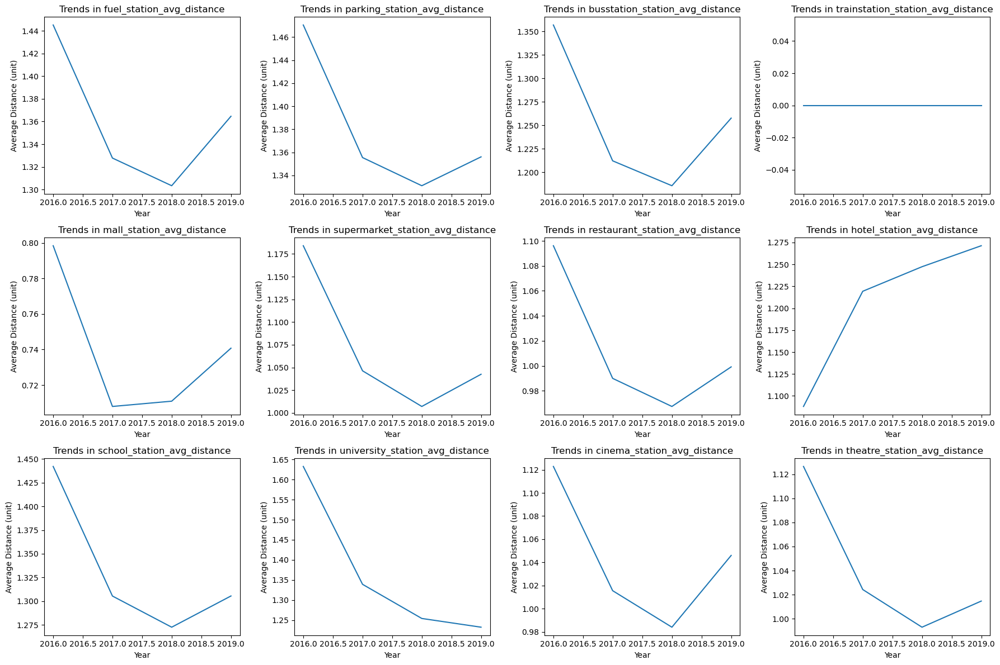

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'aggregated_by_year_df' is your DataFrame with yearly aggregated data

# List of distance-related columns
distance_columns = [
    'fuel_station_avg_distance', 'parking_station_avg_distance', 'busstation_station_avg_distance',
    'trainstation_station_avg_distance', 'mall_station_avg_distance', 'supermarket_station_avg_distance',
    'restaurant_station_avg_distance', 'hotel_station_avg_distance', 'school_station_avg_distance',
    'university_station_avg_distance', 'cinema_station_avg_distance', 'theatre_station_avg_distance'
]

# 1. Generate and print descriptive statistics
print("==== Descriptive Statistics ====\n")
descriptive_stats = {}
for col in distance_columns:
    descriptive_stats[col] = aggregated_by_year_df[col].describe()

descriptive_stats_df = pd.DataFrame(descriptive_stats)
print(descriptive_stats_df)

# 2. Trends Over Distances: Visualizing changes in distances across the years

# Set up the matplotlib figure
plt.figure(figsize=(18, 12))

for i, col in enumerate(distance_columns, 1):
    plt.subplot(3, 4, i)
    
    # Generate lineplot
    sns.lineplot(x='year', y=col, data=aggregated_by_year_df)
    
    # Add title and labels
    plt.title(f'Trends in {col}')
    plt.xlabel('Year')
    plt.ylabel('Average Distance (unit)')
    
plt.tight_layout()
plt.show()


#### Generates a line plot for each type of station, showing the trend in their counts over the years.

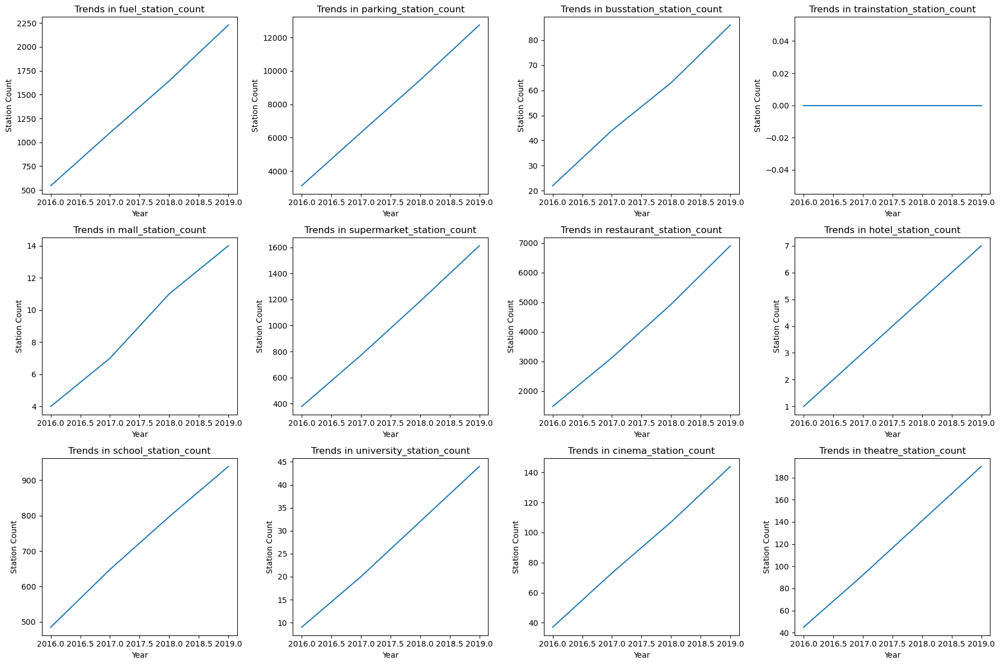

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'aggregated_by_year_df' is your DataFrame with yearly aggregated data

# List of count-related columns, assuming the names follow this format
count_columns = [
    'fuel_station_count', 'parking_station_count', 'busstation_station_count',
    'trainstation_station_count', 'mall_station_count', 'supermarket_station_count',
    'restaurant_station_count', 'hotel_station_count', 'school_station_count',
    'university_station_count', 'cinema_station_count', 'theatre_station_count'
]

# Trends Over Counts: Visualizing changes in station counts across the years

# Set up the matplotlib figure
plt.figure(figsize=(18, 12))

for i, col in enumerate(count_columns, 1):
    plt.subplot(3, 4, i)
    
    # Generate lineplot
    sns.lineplot(x='year', y=col, data=aggregated_by_year_df)
    
    # Add title and labels
    plt.title(f'Trends in {col}')
    plt.xlabel('Year')
    plt.ylabel('Station Count')
    
plt.tight_layout()
plt.show()


In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_2D_KDE(aggregated_dfs, station_types):
    """
    A function is defined to create 2D Kernel Density Estimation (KDE) plots.
    This function takes a list of aggregated DataFrames and a list of station types as its arguments.

    What the Plots Reveal

    Station Count vs. Total kWh: This plot unveils how the density of different types of stations (fuel, parking, bus stations, etc.) interacts with the total energy consumption. Areas of high density in the plot suggest that these two variables are tightly interrelated for specific ranges of values.
    Time Dependency: When the PDFs are segmented by time (yearly, monthly, weekly, weekday), patterns of human activity in relation to station density and energy consumption are revealed.

    Physical Interpretation

    Station Count: A higher density in the station count along one axis could indicate that the presence of more stations of that type is associated with either higher or lower energy consumption.
    Total kWh: A high density along the kWh axis might signify periods or locations where high energy consumption occurs, regardless of the station count.

    Yearly/Monthly/Weekly/Weekday Trends: These segmented views can indicate seasonal or weekly patterns. For example, higher energy consumption on weekdays as compared to weekends could be observed, or higher consumption in winter months due to heating needs.
    """

    # A single figure is created and a 2D grid of subplots is initialized.
    fig, axs = plt.subplots(len(station_types), 4, figsize=(35, 8 * len(station_types)))

    for i, station_type in enumerate(station_types):
        for j, (df, time_col, title) in enumerate(zip(
            aggregated_dfs,
            ['year', 'month', 'week', 'weekday'],
            ['Yearly Data', 'Monthly Data', 'Weekly Data', 'Weekday Data']
        )):
            count_col = f"{station_type}_station_count"  # The column for the count of each station type
            
            # Kernel Density Estimation (KDE) is performed and plotted. Warnings are suppressed by 'warn_singular=False'.
            sns.kdeplot(
                data=df,
                x=count_col,
                y="Total kWh_data",
                cmap="Blues",
                fill=True,
                ax=axs[i, j],
                warn_singular=False
            )
            
            # Labels and a title are added to each subplot.
            axs[i, j].set_title(f"{title} - Density of {station_type} count vs Total kWh_data")
            axs[i, j].set_xlabel(f"{count_col}")
            axs[i, j].set_ylabel("Total kWh_data")

    # The layout is adjusted and the figure is displayed.
    plt.tight_layout()
    plt.show()

# Aggregated DataFrames, named for example as:
# aggregated_by_year_df, aggregated_by_month_df, aggregated_by_week_df, aggregated_by_weekday_df
aggregated_dfs = [
    aggregated_by_year_df,
    aggregated_by_month_df,
    aggregated_by_week_df,
    aggregated_by_weekday_df
]

# Types of stations
station_types = [
    'fuel',
    'parking',
    'busstation',
    'trainstation',
    'mall',
    'supermarket',
    'restaurant',
    'hotel',
    'school',
    'university',
    'cinema',
    'theatre'
]

# # Now call the function
# plot_2D_KDE(aggregated_dfs, station_types)


#### Plots 3D scatter plots for Total kWh_data, stations count, and year.
Similar plots for other time aggregations.

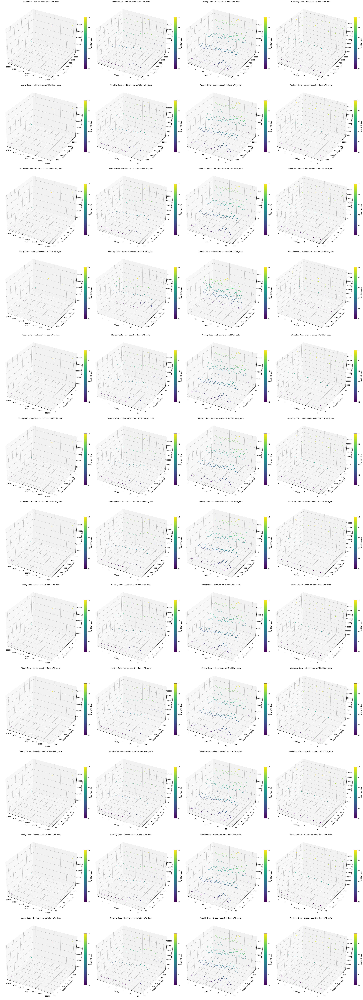

In [22]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm

# Function to create a 3D scatter plot
def plot_3d(ax, df, time_col, y_col, z_col, title):
    x = df[time_col]
    y = df[y_col]
    z = df[z_col]
    
    # Normalize to [0,1]
    norm = plt.Normalize(z.min(), z.max())
    colors = cm.viridis(norm(z))
    
    scatter = ax.scatter(x, y, z, c=colors, marker='o')
    
    # Create colorbar
    cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
    cbar.set_label('Total kWh_data')
    
    ax.set_xlabel(time_col)
    ax.set_ylabel(y_col)
    ax.set_zlabel(z_col)
    ax.set_title(title)

# List of station types for station count
station_types = ['fuel', 'parking', 'busstation', 'trainstation', 'mall', 'supermarket', 
                 'restaurant', 'hotel', 'school', 'university', 'cinema', 'theatre']

# Create a figure with multiple subplots
fig, axs = plt.subplots(len(station_types), 4, figsize=(35, 8 * len(station_types)), subplot_kw={'projection': '3d'})

# Loop over each type of station and each time scale
for i, station_type in enumerate(station_types):
    for j, (df, time_col, title) in enumerate(zip(
        [aggregated_by_year_df, aggregated_by_month_df, aggregated_by_week_df, aggregated_by_weekday_df],
        ['year', 'month', 'week', 'weekday'],
        ['Yearly Data', 'Monthly Data', 'Weekly Data', 'Weekday Data']
    )):
        count_col = f"{station_type}_station_count"
        
        # Plot with station count as the y-axis and total kWh_data as the z-axis
        plot_3d(axs[i, j], df, time_col, count_col, 'Total kWh_data', f"{title} - {station_type} count vs Total kWh_data")

plt.tight_layout()
plt.show()


In [23]:
# Replace "_2016" with "", "_2017" with "", etc. in column names
def rename_columns(df, year):
    new_columns = {col: col.replace(f"_{year}", "") for col in df.columns}
    df.rename(columns=new_columns, inplace=True)

# Rename columns in each dataframe
rename_columns(df_2016, 2016)
rename_columns(df_2017, 2017)
rename_columns(df_2018, 2018)
rename_columns(df_2019, 2019)

# Now concatenate along rows (axis=0)
df_all_years = pd.concat([df_2016, df_2017, df_2018, df_2019], ignore_index=True)

# Check the final dataframe
df_all_years.head()

,Date_Hour,Start DateTime,CP ID_data,Connector_data,Total kWh_data,Site_data,Model_data,End DateTime,Site_encoded_data,Model_encoded_data,geometry,name_data,datetime,temp_data,feelslike_data,dew_data,humidity_data,precip_data,precipprob_data,preciptype_data,snow_data,snowdepth_data,windgust_data,windspeed_data,winddir_data,sealevelpressure_data,cloudcover_data,visibility_data,solarradiation_data,solarenergy_data,uvindex_data,severerisk_data,conditions_data,icon_data,stations_data,Unnamed: 0,CP ID,Connector,Total kWh,Site,Model,Site_encoded,Model_encoded,name,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,day_of_week
0,2016-01-09 07:00:00,2016-01-09 07:21:00,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-09 07:27:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-09 07:00:00,-1.4,-1.4,-1.4,99.90,0.000,0,0,0.0,2.00,0.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",2,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,0.0,3.0,Scotland,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,Saturday
1,2016-01-09 18:00:00,2016-01-09 18:22:00,50994,2,11.150,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-09 19:00:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-09 18:00:00,2.9,-0.1,2.0,94.24,0.633,100,rain,0.0,1.58,0.0,11.2,89,982.3,90.0,18.0,0.0,0.0,0,0.0,"Rain, Partially cloudy",rain,"03144099999,03158099999,03166099999,0317109999...",2,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,0.0,3.0,Scotland,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,Saturday
2,2016-01-11 07:00:00,2016-01-11 07:06:00,50994,1,5.895,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-11 07:57:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-11 07:00:00,2.7,-0.5,0.6,86.38,0.000,0,"rain,snow",0.0,0.00,54.0,12.0,227,976.9,69.4,32.1,0.0,0.0,0,0.0,Partially cloudy,partly-cloudy-night,"03144099999,03158099999,03166099999,0317109999...",2,50994,1,2.084,Leslie Street Car Park,APT Triple Rapid Charger,0.0,3.0,Scotland,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,Monday
3,2016-01-11 09:00:00,2016-01-11 09:27:00,50994,2,9.720,Leslie Street Car Park,APT Triple Rapid Charger,2016-01-11 10:22:00,0.0,3.0,POINT (-3.338015029709677 56.59132102107761),Scotland,2016-01-11 09:

In [24]:
# Convert the datetime columns to pandas datetime objects
df_all_years['Start DateTime'] = pd.to_datetime(df_all_years['Start DateTime'])
df_all_years['End DateTime'] = pd.to_datetime(df_all_years['End DateTime'])

# Compute the charging time
df_all_years['charging_time'] = df_all_years['End DateTime'] - df_all_years['Start DateTime']


In [25]:
def process_dataframe(df):
    """
    Process the DataFrame to add a 'charging_time' column, move it to the 8th position,
    and remove the specified columns if they exist.
    
    Parameters:
    df (DataFrame): The DataFrame to process.
    
    Returns:
    DataFrame: The processed DataFrame.
    """
    df = df.copy()
    # Compute the 'charging_time' column
    df['charging_time'] = pd.to_datetime(df['End DateTime']) - pd.to_datetime(df['Start DateTime'])
        
    # Columns to be removed
    cols_to_remove = [
        'CP ID_data', 'Connector_data', 'Total kWh_data', 'Site_data', 'Model_data',
        'Site_encoded_data', 'datetime', 'Model_encoded_data', 'name_data', 'temp_data', 
        'feelslike_data', 'dew_data', 'humidity_data', 'precip_data', 'precipprob_data', 
        'preciptype_data', 'snow_data', 'snowdepth_data', 'windgust_data', 'windspeed_data', 
        'winddir_data', 'sealevelpressure_data', 'cloudcover_data', 'visibility_data', 
        'solarradiation_data', 'solarenergy_data', 'uvindex_data', 'severerisk_data', 
        'conditions_data', 'icon_data', 'stations_data', 'Unnamed: 0', 'Site', 'Model',
        'name', 'CP ID', 'day_of_week'
    ]
    
    # Remove the columns if they exist
    for col in cols_to_remove:
        if col in df.columns:
            df.drop(columns=col, inplace=True)
    
    return df

# Example of how to use the function
# Assuming df_all_years is your original DataFrame
df_all_years = process_dataframe(df_all_years)

In [26]:
# Get the current order of columns
cols = df_all_years.columns.tolist()

# Move the new 'charging_time' column to the 8th position (index starts from 0)
cols = cols[:3] + ['charging_time'] + cols[3:-1]

# Reorder the DataFrame
df_all_years = df_all_years[cols]

In [27]:
df_all_years.head()

,Date_Hour,Start DateTime,End DateTime,charging_time,geometry,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday
0,2016-01-09 07:00:00,2016-01-09 07:21:00,2016-01-09 07:27:00,0 days 00:06:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5
1,2016-01-09 18:00:00,2016-01-09 18:22:00,2016-01-09 19:00:00,0 days 00:38:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5
2,2016-01-11 07:00:00,2016-01-11 07:06:00,2016-01-11 07:57:00,0 days 00:51:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0
3,2016-01-11 09:00:00,2016-01-11 09:27:00,2016-01-11 10:22:00,0 days 00:55:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0
4,2016-01-11 18:00:00,2016-01-11 18:35:00,2016-01-11 18:57:00,0 days 00:22:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0


In [28]:
data = df_all_years

    Understanding the Dataset:

        Check the first few rows of the dataset using the head() function.
        Understand the number of rows and columns using the shape attribute.
        Get the column names using the columns attribute.
        Get information about the datatype of each column, number of non-null entries etc. using the info() function.

    Descriptive Statistics:

        Use the describe() function to get the central tendency, dispersion and shape of the dataset’s distribution.

    Handling Missing Values:

        Check for missing values using the isna() function. You've already done this and you have 185 missing values in 'Total kWh' and 'End DateTime' columns.
        Decide on a strategy to handle the missing values. This could be removing the rows with missing values, or filling the missing values with mean, median, or mode of the rest of the data.

    Visualizing the Dataset:

        Histograms: Plot histograms of each column to visualize the distribution of values.
        Boxplots: Plot boxplots to visualize the spread and skewness of the data.
        Correlation Matrix: Use a correlation matrix or a heatmap to see the correlation between different numeric variables.

    Time Series Specific Analysis:

        Line Plots: Plot the 'Total kWh' against time to visualize how the power demand changes over time.
        Seasonality: Check for seasonality patterns, which are trends that repeat after a specific time interval. This could be daily, weekly, monthly, or annually.
        Trend Analysis: Check if there's a consistent upward or downward slope in the 'Total kWh' over time.
        Decomposition: Decompose the time series to observe its trend, seasonality, and residual components separately.

    Outlier Detection:

        Use scatter plots, boxplots or IQR (interquartile range) methods to identify any outliers in your data.

    Feature Relationships:

        Use scatter plots or pair plots to visualize relationships between different numeric features.
        Visualize the average power demand ('Total kWh') for different categories in 'Site' and 'Model' columns to see if there are any significant differences.

### Understanding the dataset

In [29]:
data.shape

(66664, 59)

In [30]:
data.columns

Index(['Date_Hour', 'Start DateTime', 'End DateTime', 'charging_time',
       'geometry', 'Connector', 'Total kWh', 'Site_encoded', 'Model_encoded',
       'temp', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'preciptype', 'snow', 'snowdepth', 'windgust', 'windspeed', 'winddir',
       'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation',
       'solarenergy', 'uvindex', 'severerisk', 'conditions', 'icon',
       'stations', 'fuel_station_count', 'fuel_station_avg_distance',
       'parking_station_count', 'parking_station_avg_distance',
       'busstation_station_count', 'busstation_station_avg_distance',
       'trainstation_station_count', 'trainstation_station_avg_distance',
       'mall_station_count', 'mall_station_avg_distance',
       'supermarket_station_count', 'supermarket_station_avg_distance',
       'restaurant_station_count', 'restaurant_station_avg_distance',
       'hotel_station_count', 'hotel_station_avg_distance',
       'school_station

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66664 entries, 0 to 66663
Data columns (total 59 columns):
 #   Column                             Non-Null Count  Dtype          
---  ------                             --------------  -----          
 0   Date_Hour                          66664 non-null  object         
 1   Start DateTime                     66664 non-null  datetime64[ns] 
 2   End DateTime                       66664 non-null  datetime64[ns] 
 3   charging_time                      66664 non-null  timedelta64[ns]
 4   geometry                           66664 non-null  object         
 5   Connector                          66664 non-null  int64          
 6   Total kWh                          66664 non-null  float64        
 7   Site_encoded                       66664 non-null  float64        
 8   Model_encoded                      66664 non-null  float64        
 9   temp                               66664 non-null  float64        
 10  feelslike             

Descriptive Statistics

In [32]:
data.describe()

,charging_time,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday
count,66664,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.0,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.0,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.0,66664.0,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.000000,66664.0,66664.000000
mean,-51 days +12:09:49.271570863,1.479179,9.180048,10.268091,2.370005,0.509380,-0.591414,-0.721653,92.877284,0.081724,3.927157,0.0,1.322079,51.412866,5.073170,224.406201,995.076974,89.971113,8.535802,19.382965,0.059248,0.172987,0.0,1646.678117,1.338644,9436.115085,1.353887,63.793727,1.226776,0.0,0.0,10.639941,0.725676,1183.028966,1.039188,4958.366600,0.991466,4.959588,1.239083,790.760140,1.301965,31.818223,1.290131,107.211403,1.021041,140.131300,1.015930,2017.979794,6.519231,26.514761,2.966969
std,946 days 00:50:17.069538464,0.586963,7.293375,6.604665,1.933132,3.107117,2.174240,2.661652,13.753628,0.404217,19.424181,0.0,0.905670,4.168482,6.136381,141.610557,18.371887,13.186279,9.391677,42.246733,0.150123,0.500830,0.0,510.443412,0.189878,2915.416800,0.198715,19.167950,0.191777,0.0,0.0,3.118298,0.214038,377.775988,0.190644,1680.738105,0.191014,1.812238,0.185917,134.254152,0.190608,10.742655,0.212243,32.229187,0.185317,44.136405,0.190006,0.906119,3.354743,14.590991,1.975000
min,-18239 days +04:26:00,1.000000,0.380000,0.000000,0.000000,-5.700000,-5.700000,-6.800000,54.490000,0.000000,0.000000,0.0,0.000000,44.600000,0.200000,1.000000,968.500000,25.800000,0.700000,0.000000,0.000000,0.000000,0.0,546.000000,1.229303,3118.000000,1.239842,22.000000,1.094700,0.0,0.0,4.000000,0.524985,378.000000,0.954287,1479.000000,0.872756,1.000000,0.695048,485.000000,1.193576,9.000000,1.180631,37.000000,0.909118,45.000000,0.938228,2016.000000,1.000000,1.0,0.000000
25%,0 days 00:18:00,1.000000,3.580000,3.000000,0.000000,-1.400000,-1.400000,-1.500000,93.940000,0.000000,0.000000,0.0,0.000000,49.300000,0.200000,76.000000,989.500000,89.000000,1.000000,0.000000,0.000000,0.000000,0.0,1100.000000,1.293989,6303.000000,1.317919,44.000000,1.176244,0.0,0.0,7.000000,0.627723,771.000000,0.991235,3123.000000,0.936936,3.000000,1.204030,648.000000,1.266506,20.000000,1.220094,73.000000,0.965916,92.000000,0.967940,2017.000000,4.000000,14.0,1.000000
50%,0 days 00:31:00,1.000000,8.911000,12.000000,3.000000,-1.100000,-1.100000,-1.400000,99.520000,0.000000,0.000000,0.0,1.960000,51.800000,0.200000,259.000000,989.900000,97.000000,1.400000,0.700000,0.000000,0.000000,0.0,1644.000000,1.313067,9450.000000,1.351033,63.000000,1.200711,0.0,0.0,11.000000,0.703766,1186.000000,1.001239,4926.000000,0.951264,5.000000,1.248982,797.000000,1.283300,32.000000,1.261911,107.000000,0.974810,141.000000,0.982719,2018.000000,7.000000,27.0,3.000000
75%,0 days 01:00:00,2.000000,13.930000,17.000000,3.000000

# Data Cleaning   

## Handling NaN values

    This function checks each numeric column, counts the number of NaN values, and if it's higher than 5% of the total rows in the DataFrame, it drops the entire column, else it replaces NaNs with the mean:

In [33]:
data.isna().sum()

Date_Hour                            0
Start DateTime                       0
End DateTime                         0
charging_time                        0
geometry                             0
Connector                            0
Total kWh                            0
Site_encoded                         0
Model_encoded                        0
temp                                 0
feelslike                            0
dew                                  0
humidity                             0
precip                               0
precipprob                           0
preciptype                           0
snow                                 0
snowdepth                            0
windgust                             0
windspeed                            0
winddir                              0
sealevelpressure                     0
cloudcover                           0
visibility                           0
solarradiation                       0
solarenergy              

In [34]:
def drop_nan_columns(df, threshold=0.05):
    """
    Drop columns from df where the proportion of NaN values exceeds the threshold.
    """
    for col in df.columns:
        if df[col].isnull().mean() > threshold:
            df = df.drop(col, axis=1)
            print(f"Dropped column '{col}' due to more than {threshold*100}% missing values.")
    return df


def fill_nan_with_mean(df):
    """
    Fill numeric columns in df with NaN values with the mean value of the column.
    """
    numeric_cols = df.select_dtypes(include=['float64', 'int64', 'int32']).columns
    for col in numeric_cols:
        num_nans = df[col].isnull().sum()
        if num_nans > 0:
            df[col] = df[col].fillna(df[col].mean())
            percentage_nans = (num_nans / df.shape[0]) * 100  # calculate percentage of NaN values
            print(f"Replaced {num_nans} NaN values ({percentage_nans:.2f}%) in column '{col}' with the mean of the column.")
    return df


def fill_nan_with_mode(df):
    """
    Fill categorical columns NaN values with the mode (most frequent value) of the column.
    """
    categorical_cols = df.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        num_nans = df[col].isnull().sum()
        if num_nans > 0:
            df[col] = df[col].fillna(df[col].mode()[0])  # replace NaNs with the mode
            percentage_nans = (num_nans / df.shape[0]) * 100  # calculate percentage of NaN values
            print(f"Replaced {num_nans} NaN values ({percentage_nans:.2f}%) in column '{col}' with the mode of the column.")
    return df


def process_nan_values(df, drop_threshold=0.05):
    """
    Process NaN values in a dataframe.
    
    Columns where the proportion of NaNs exceeds drop_threshold are dropped.
    Remaining NaNs in numeric columns are replaced with the column mean.
    """
    df = drop_nan_columns(df, threshold=drop_threshold)
    df = fill_nan_with_mean(df)
    fill_nan_with_mode(df)
    return df


In [35]:
df = process_nan_values(data)

In [36]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66664 entries, 0 to 66663
Data columns (total 59 columns):
 #   Column                             Non-Null Count  Dtype          
---  ------                             --------------  -----          
 0   Date_Hour                          66664 non-null  object         
 1   Start DateTime                     66664 non-null  datetime64[ns] 
 2   End DateTime                       66664 non-null  datetime64[ns] 
 3   charging_time                      66664 non-null  timedelta64[ns]
 4   geometry                           66664 non-null  object         
 5   Connector                          66664 non-null  int64          
 6   Total kWh                          66664 non-null  float64        
 7   Site_encoded                       66664 non-null  float64        
 8   Model_encoded                      66664 non-null  float64        
 9   temp                               66664 non-null  float64        
 10  feelslike             

In [37]:
X_base = df
y_base = df['Total kWh']
print(X_base.shape)

# Number of unique values for each column
counts = X_base.nunique()
# record columns to delete
single_value = [i for i,v in enumerate(counts) if v == 1]
print(single_value)

(66664, 59)
[15, 16, 27, 37, 38]


In [38]:
y_base

0        2.084
1        2.084
2        2.084
3        2.084
4        2.084
         ...  
66659    5.713
66660    5.713
66661    5.713
66662    5.713
66663    5.713
Name: Total kWh, Length: 66664, dtype: float64

## Uniqueness

Column 'Date_Hour' has 16937 unique values (25.41%).
Column 'Start DateTime' has 63953 unique values (95.93%).
Column 'End DateTime' has 63577 unique values (95.37%).
Column 'charging_time' has 1797 unique values (2.70%).
Column 'geometry' has 16 unique values (0.02%).
Column 'Connector' has 3 unique values (0.00%).
Column 'Total kWh' has 16 unique values (0.02%).
Column 'Site_encoded' has 16 unique values (0.02%).
Column 'Model_encoded' has 7 unique values (0.01%).
Column 'temp' has 13 unique values (0.02%).
Column 'feelslike' has 13 unique values (0.02%).
Column 'dew' has 15 unique values (0.02%).
Column 'humidity' has 15 unique values (0.02%).
Column 'precip' has 2 unique values (0.00%).
Column 'precipprob' has 2 unique values (0.00%).
Column 'preciptype' has 1 unique values (0.00%).
Column 'snow' has 1 unique values (0.00%).
Column 'snowdepth' has 5 unique values (0.01%).
Column 'windgust' has 10 unique values (0.02%).
Column 'windspeed' has 12 unique values (0.02%).
Column 'winddi

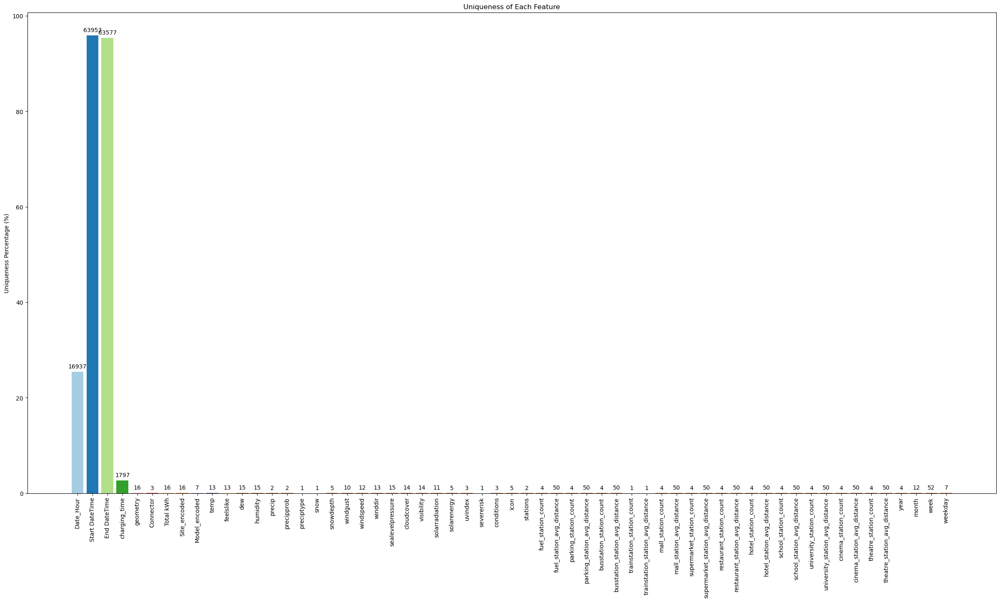

In [39]:
def calculate_uniqueness(df):
    """
    Calculate the uniqueness of each column in a dataframe.
    Returns a dictionary with the percentage of unique values and number of unique values for each column.
    """
    num_rows = df.shape[0]
    uniqueness_dict = {}
    
    for col in df.columns:
        num_unique_values = df[col].nunique()
        uniqueness_percentage = (num_unique_values / num_rows) * 100
        uniqueness_dict[col] = (uniqueness_percentage, num_unique_values)
        print(f"Column '{col}' has {num_unique_values} unique values ({uniqueness_percentage:.2f}%).")
    
    return uniqueness_dict

def plot_uniqueness(uniqueness_dict):
    """
    Plot the percentage of unique values for each feature in a dataframe.
    Also, annotate each bar with the number of unique values.
    """
    # Prepare data for plotting
    labels = uniqueness_dict.keys()
    uniqueness_percentages = [val[0] for val in uniqueness_dict.values()]
    num_unique_values = [val[1] for val in uniqueness_dict.values()]
    
    # Plotting
    fig, ax = plt.subplots(figsize=(30, 15))
    bars = ax.bar(labels, uniqueness_percentages, color=plt.cm.Paired(np.arange(len(labels))))
    plt.ylabel('Uniqueness Percentage (%)')
    plt.title('Uniqueness of Each Feature')
    plt.xticks(rotation=90)
    
    # Adding labels to bars
    for bar, unique_count in zip(bars, num_unique_values):
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval + 0.5, unique_count, ha='center', va='bottom')

    plt.show()

# Call the functions
uniqueness_dict = calculate_uniqueness(X_base)
plot_uniqueness(uniqueness_dict)



In [40]:
X_base.head()

,Date_Hour,Start DateTime,End DateTime,charging_time,geometry,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday
0,2016-01-09 07:00:00,2016-01-09 07:21:00,2016-01-09 07:27:00,0 days 00:06:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5
1,2016-01-09 18:00:00,2016-01-09 18:22:00,2016-01-09 19:00:00,0 days 00:38:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5
2,2016-01-11 07:00:00,2016-01-11 07:06:00,2016-01-11 07:57:00,0 days 00:51:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0
3,2016-01-11 09:00:00,2016-01-11 09:27:00,2016-01-11 10:22:00,0 days 00:55:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0
4,2016-01-11 18:00:00,2016-01-11 18:35:00,2016-01-11 18:57:00,0 days 00:22:00,POINT (-3.338015029709677 56.59132102107761),1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,rain,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,Overcast,cloudy,"03144099999,03158099999,03166099999,0317109999...",546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0


In [41]:
def encode_categorical_columns(data, categorical_columns):
    data_encoded = data.copy()
    encoders = {col: OrdinalEncoder() for col in categorical_columns}
    for col, encoder in encoders.items():
        data_encoded[col + '_encoded'] = encoder.fit_transform(data_encoded[[col]])
    return data_encoded

# Assuming df is your original DataFrame
# Convert the 'geometry' column to geometric data
df['geometry'] = df['geometry'].apply(wkt.loads)

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Extract x and y coordinates
gdf['x'] = gdf['geometry'].apply(lambda geom: geom.x)
gdf['y'] = gdf['geometry'].apply(lambda geom: geom.y)

# Specify the categorical columns
categorical_columns = ['x', 'y'] 

# Encode the coordinates
data_encoded = encode_categorical_columns(gdf, categorical_columns)

# Now data_encoded should have the encoded x and y coordinates


def append_target_variable(data, y_base):
    # Create a separate dataframe for y_base
    y_base_df = pd.DataFrame(y_base, columns=['Total kWh'])

    # Append y_base to the encoded dataframe
    data = pd.concat([data, y_base_df], axis=1)

    return data

def save_encoded_data(data, save_path, file_name):
    # Save the dataframe
    data.to_csv(os.path.join(save_path, f'{file_name}.csv'), index=True)

def encode_and_save(data, y_base, categorical_columns, save_path, file_name):
    data_encoded = encode_categorical_columns(data, categorical_columns)
    # data_encoded = append_target_variable(data_encoded, y_base)
    # save_encoded_data(data_encoded, save_path, file_name)

    return data_encoded

# Specify the categorical columns
categorical_columns = ['preciptype', 'conditions', 'icon', 'stations']  

# Drop columns
data_encoded = data_encoded.loc[:, ~data_encoded.columns.str.contains('Date_Hour|geometry')]

# Get the absolute path
cwd = os.getcwd()
DATA_PATH_interim = os.path.join(cwd, '..', 'data', 'interim')

# Use function
data_encoded = encode_and_save(data_encoded, y_base, categorical_columns, DATA_PATH_interim, 'train_data_encoded')
data_encoded = data_encoded.loc[:, ~data_encoded.columns.str.contains('preciptype|conditions|icon|stations')]
# Drop 'x' and 'y' columns
data_encoded = data_encoded.drop(columns=['x', 'y'])

In [42]:
data_encoded.head()

,Start DateTime,End DateTime,charging_time,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,x_encoded,y_encoded
0,2016-01-09 07:21:00,2016-01-09 07:27:00,0 days 00:06:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,-3.338015,56.591321
1,2016-01-09 18:22:00,2016-01-09 19:00:00,0 days 00:38:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,-3.338015,56.591321
2,2016-01-11 07:06:00,2016-01-11 07:57:00,0 days 00:51:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,-3.338015,56.591321
3,2016-01-11 09:27:00,2016-01-11 10:22:00,0 days 00:55:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,-3.338015,56.591321
4,2016-01-11 18:35:00,2016-01-11 18:57:00,0 days 00:22:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,-3.338015,56.591321


In [43]:
data_encoded.shape

(66664, 55)

In [44]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66664 entries, 0 to 66663
Data columns (total 55 columns):
 #   Column                             Non-Null Count  Dtype          
---  ------                             --------------  -----          
 0   Start DateTime                     66664 non-null  datetime64[ns] 
 1   End DateTime                       66664 non-null  datetime64[ns] 
 2   charging_time                      66664 non-null  timedelta64[ns]
 3   Connector                          66664 non-null  int64          
 4   Total kWh                          66664 non-null  float64        
 5   Site_encoded                       66664 non-null  float64        
 6   Model_encoded                      66664 non-null  float64        
 7   temp                               66664 non-null  float64        
 8   feelslike                          66664 non-null  float64        
 9   dew                                66664 non-null  float64        
 10  humidity              

## Variance Filtering

It is not really necessary becasue we are working with a low number of features, and most of them are categorical values. So we dont have continuos values. 

In [45]:
X_base = data_encoded
y_base = data_encoded['Total kWh']
print(X_base.shape)

(66664, 55)


/tmp/ipykernel_1904/337050810.py:10: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  variances = df_numeric.var()


Variance of Connector: 0.3445254591606642
Variance of Total kWh: 53.193321549108326
Variance of Site_encoded: 43.62159942677802
Variance of Model_encoded: 3.736997458837195
Variance of temp: 9.65417585113242
Variance of feelslike: 4.727318680182517
Variance of dew: 7.0843924420740825
Variance of humidity: 189.16229665527842
Variance of precip: 0.16339154926894345
Variance of precipprob: 377.2988055564705
Variance of snow: 0.0
Variance of snowdepth: 0.820237350887762
Variance of windgust: 17.3762404155115
Variance of windspeed: 37.65516601009659
Variance of winddir: 20053.54993739262
Variance of sealevelpressure: 337.52621567002967
Variance of cloudcover: 173.87794943173228
Variance of visibility: 88.20359272053031
Variance of solarradiation: 1784.786458086432
Variance of solarenergy: 0.022536919853554865
Variance of uvindex: 0.2508305183474159
Variance of severerisk: 0.0
Variance of fuel_station_count: 260552.47710179954
Variance of fuel_station_avg_distance: 0.03605363654943415
Varian

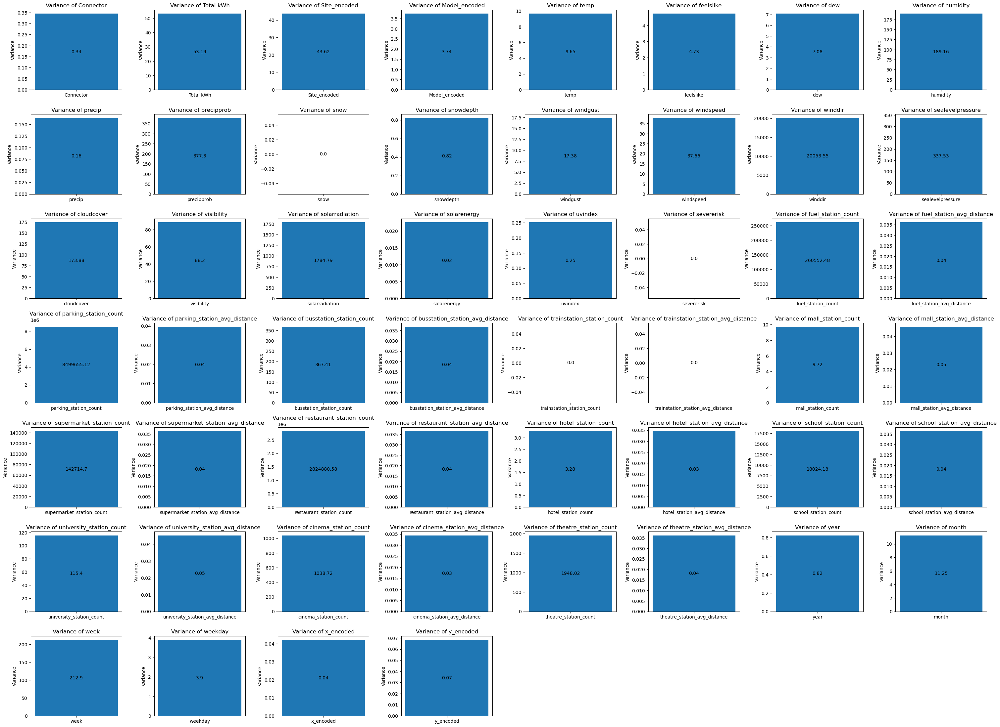

In [46]:
def calculate_feature_variances(df):
    """
    Calculate the variance of each column in a dataframe.
    Return a Series with the column name as the index and the variance as the value.
    """
    # Filter out non-numeric columns
    df_numeric = df.select_dtypes(include=[np.number])

    # Calculate variances
    variances = df_numeric.var()

    return variances

def plot_feature_variances(variances):
    """
    Plot the variance for each column in the variances Series
    and print the variance.
    """
    # Determine the grid size for the subplots
    grid_size = int(np.ceil(np.sqrt(len(variances))))

    # Create a grid of subplots
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(30, 25))
    axes = axes.ravel()  # flatten axes

    # Print and plot each variance
    for i, (column, variance) in enumerate(variances.items()):
        print(f'Variance of {column}: {variance}')

        axes[i].bar(column, variance)
        axes[i].set_title(f'Variance of {column}')
        axes[i].set_ylabel('Variance')

        # Add the variance value inside the bar
        axes[i].text(column, variance / 2, round(variance, 2), ha='center', va='center')

    # Remove unused subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Usage:
variances = calculate_feature_variances(X_base)
plot_feature_variances(variances)

    If the 'Connector' feature is categorical and encoded as integers, then using VarianceThreshold may not be appropriate. VarianceThreshold is generally used for continuous numerical data. For categorical data, you might want to consider other methods of feature selection that are more appropriate for categorical data. For example, you could use chi-square test to test the independence between the categorical feature and the target variable. The features that are independent of the target variable can be dropped as they don't contribute to the model.

In [47]:
def plot_column_histograms_eu(dataframe, fig_size=(10, 5)):
    """
    Plot histograms for all numeric columns of a Pandas DataFrame.

    Parameters:
    dataframe (pandas.DataFrame): The input DataFrame containing the columns to plot.
    fig_size (tuple): The size of the figure in inches (default: (10, 5)).

    Returns:
    None
    """
    # Select only numeric columns
    numeric_cols = dataframe.select_dtypes(include=['int64', 'float64']).columns

    # Determine the number of subplots and the number of rows and columns needed
    num_subplots = len(numeric_cols)
    num_cols = min(num_subplots, 4)
    num_rows = math.ceil(num_subplots / num_cols)

    # Create the figure and subplots
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=fig_size, squeeze=False)

    # Remove any unused subplots
    for i in range(num_subplots, num_rows * num_cols):
        fig.delaxes(axs.flatten()[i])

    for i, col_name in enumerate(numeric_cols):
        try:
            row = i // num_cols
            col = i % num_cols
            axs[row, col].hist(dataframe[col_name], bins=40, facecolor='b', edgecolor='white')
            xlabel = col_name.split('_')[0]  # use the first part of the column name
            axs[row, col].set_title(f"{xlabel} Histogram")
            axs[row, col].set_xlabel(f'(range: {dataframe[col_name].min()} - {dataframe[col_name].max()})', rotation=0)  # rotate the label for better readability

            # Add y-axis label to the first column of histograms
            if col == 0:
                axs[row, col].set_ylabel("Frequency")
            else:
                axs[row, col].set_title(f"{xlabel} Histogram")

        except ValueError:
            print(f"Skipping column '{col_name}' because of 'ValueError: autodetected range of [nan, nan] is not finite'")

    fig.subplots_adjust(hspace=0.5)
    plt.show()

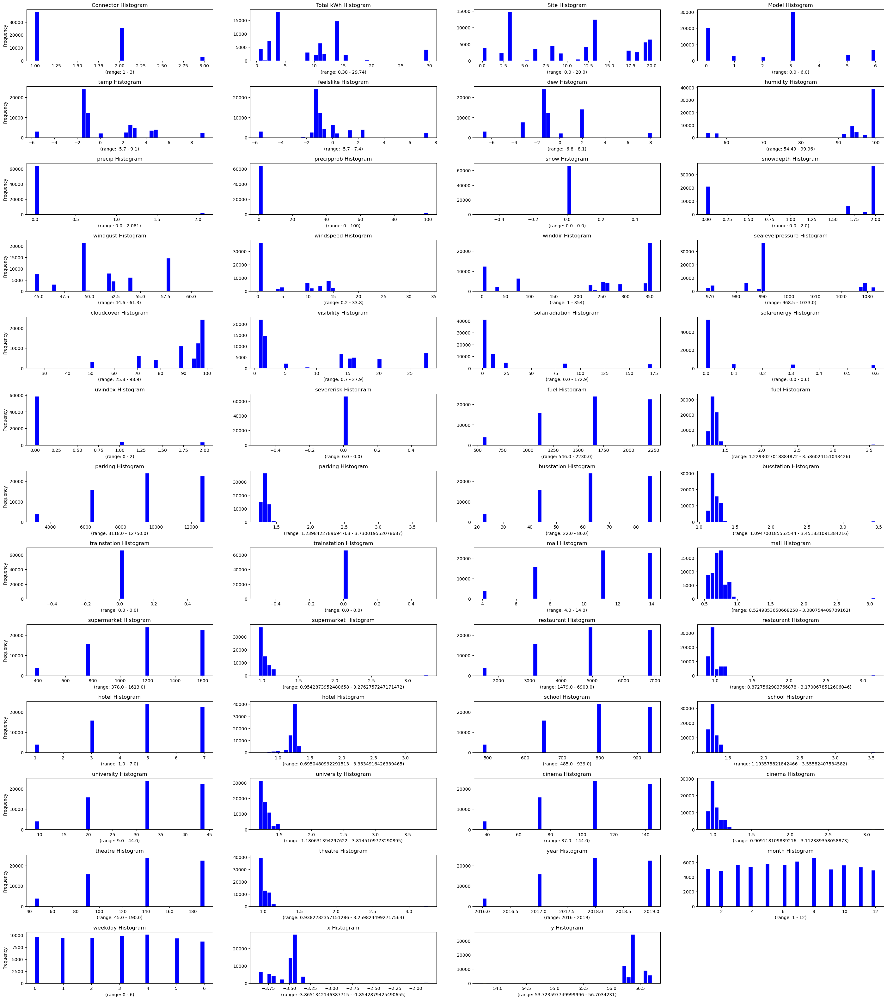

In [48]:
plot_column_histograms_eu(X_base, fig_size=(35, 40))

In [49]:
X_base.to_csv(os.path.join(cwd, '..', 'data', 'interim', 'data_encoded.csv'))

## Exploring time-related information

In [50]:
def data_wetaher():
    data_path = os.path.join(DATA_PATH, 'interim', 'data_encoded.csv') #,parse_dates=[['Date', 'Hour']]) if date and hour to be merged here.
    data = pd.read_csv(data_path)
    # Drop 'Unnamed' columns
    data = data.loc[:, ~data.columns.str.contains('^Unnamed')]
    return data

X_base = data_wetaher()
# Display all columns
pd.set_option('display.max_columns', None)
X_base.head()

,Start DateTime,End DateTime,charging_time,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,x_encoded,y_encoded
0,2016-01-09 07:21:00,2016-01-09 07:27:00,0 days 00:06:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,-3.338015,56.591321
1,2016-01-09 18:22:00,2016-01-09 19:00:00,0 days 00:38:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,-3.338015,56.591321
2,2016-01-11 07:06:00,2016-01-11 07:57:00,0 days 00:51:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,-3.338015,56.591321
3,2016-01-11 09:27:00,2016-01-11 10:22:00,0 days 00:55:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,-3.338015,56.591321
4,2016-01-11 18:35:00,2016-01-11 18:57:00,0 days 00:22:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,2,0,-3.338015,56.591321


In [51]:
X_base.columns

Index(['Start DateTime', 'End DateTime', 'charging_time', 'Connector',
       'Total kWh', 'Site_encoded', 'Model_encoded', 'temp', 'feelslike',
       'dew', 'humidity', 'precip', 'precipprob', 'snow', 'snowdepth',
       'windgust', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover',
       'visibility', 'solarradiation', 'solarenergy', 'uvindex', 'severerisk',
       'fuel_station_count', 'fuel_station_avg_distance',
       'parking_station_count', 'parking_station_avg_distance',
       'busstation_station_count', 'busstation_station_avg_distance',
       'trainstation_station_count', 'trainstation_station_avg_distance',
       'mall_station_count', 'mall_station_avg_distance',
       'supermarket_station_count', 'supermarket_station_avg_distance',
       'restaurant_station_count', 'restaurant_station_avg_distance',
       'hotel_station_count', 'hotel_station_avg_distance',
       'school_station_count', 'school_station_avg_distance',
       'university_station_count', 'univ

Given that your target variable is 'Total kWh' and you have a timestamp column 'Start DateTime', you 
can apply the decompose_time_series function to the 'Total kWh' column to visualize its trend, 
seasonality, and residuals over time. This can help to understand the underlying patterns in your target 
variable. 

The choice of 'additive' or 'multiplicative' model depends on the nature of your time series. If the trend 
and seasonal components of your time series seem to be constant over time (i.e., they do not depend 
on the level of the time series), an additive model is appropriate. If the trend and seasonal patterns 
seem to change in relation to the level of the time series (i.e., they increase when the time series 
increases), a multiplicative model is more appropriate. 

The frequency parameter is used to specify the number of data points in a single seasonal period. For 
example, if you have daily data and you suspect there's a weekly seasonality pattern, you would use 
freq=7. In your case, you would need to determine the appropriate frequency based on your 
knowledge of the data. If you're unsure, you could start with freq-I and adjust as necessary. 

Here's how you could modify the function for your data: 

In [52]:
X_base.head(2)

,Start DateTime,End DateTime,charging_time,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,x_encoded,y_encoded
0,2016-01-09 07:21:00,2016-01-09 07:27:00,0 days 00:06:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,-3.338015,56.591321
1,2016-01-09 18:22:00,2016-01-09 19:00:00,0 days 00:38:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,-3.338015,56.591321


In [53]:
X_base[444:450]

,Start DateTime,End DateTime,charging_time,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,x_encoded,y_encoded
444,2016-09-16 19:34:00,2016-09-17 10:21:00,0 days 14:47:00,2,3.87,19.0,0.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.15021,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.50291,37.0,1.135934,45.0,1.085529,2016,9,37,4,-3.738821,56.703423
445,2016-09-17 07:04:00,2016-09-17 07:28:00,0 days 00:24:00,2,3.87,19.0,0.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.15021,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.50291,37.0,1.135934,45.0,1.085529,2016,9,37,5,-3.738821,56.703423
446,2016-09-17 16:05:00,2016-09-17 18:09:00,0 days 02:04:00,2,3.87,19.0,0.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.15021,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.50291,37.0,1.135934,45.0,1.085529,2016,9,37,5,-3.738821,56.703423
447,2016-09-17 17:20:00,2016-09-17 17:44:00,0 days 00:24:00,2,3.87,19.0,0.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.15021,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.50291,37.0,1.135934,45.0,1.085529,2016,9,37,5,-3.738821,56.703423
448,2016-09-18 01:29:00,2016-09-18 13:15:00,0 days 11:46:00,2,3.87,19.0,0.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.15021,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.50291,37.0,1.135934,45.0,1.085529,2016,9,37,6,-3.738821,56.703423
449,2016-09-18 12:16:00,2016-09-18 14:00:00,0 days 01:44:00,2,3.87,19.0,0.0,-1.4,-1.4,-1.4,99.9,0.0,0,0.0,2.0,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.15021,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.50291,37.0,1.135934,45.0,1.085529,2016,9,37,6,-3.738821,56.703423


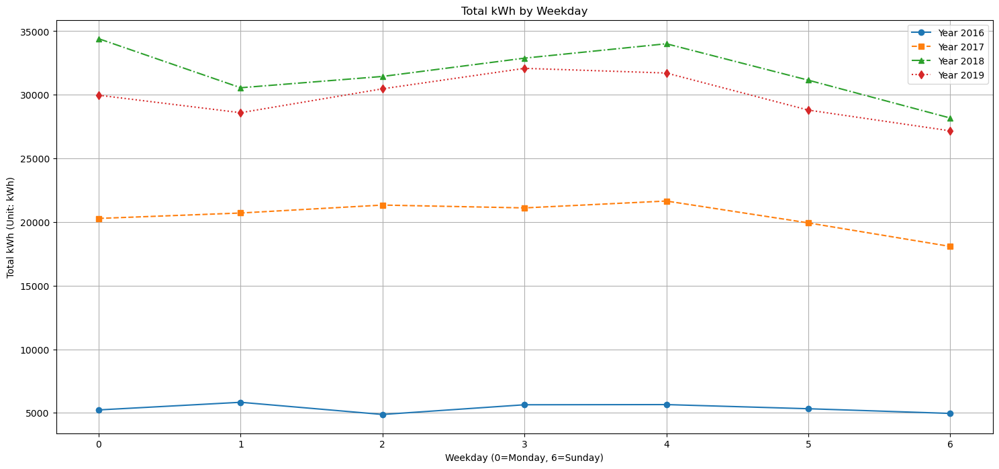

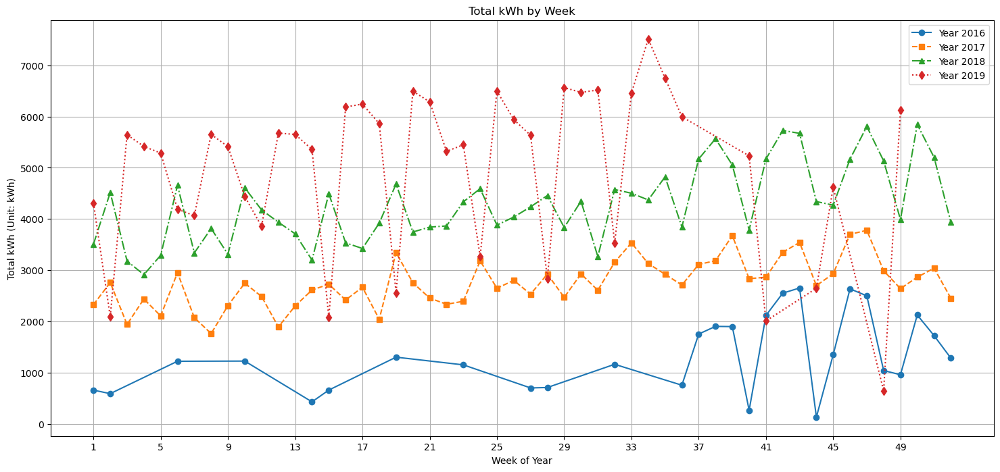

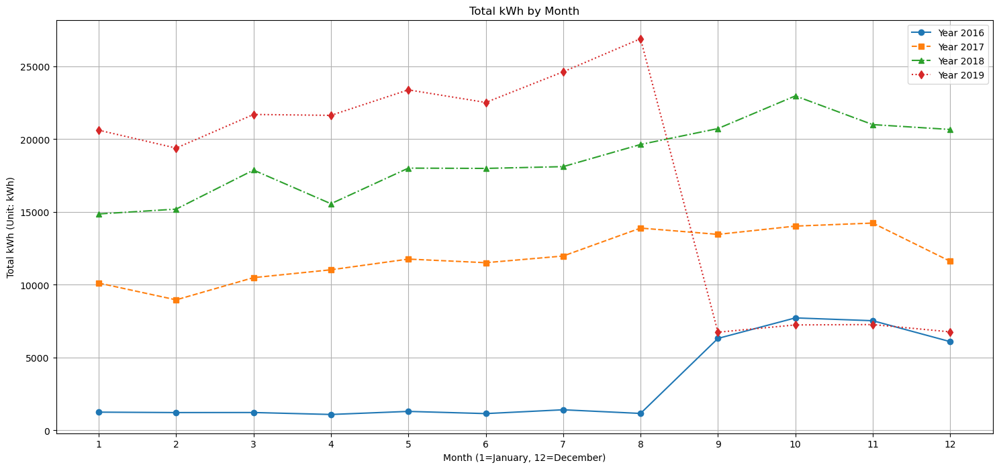

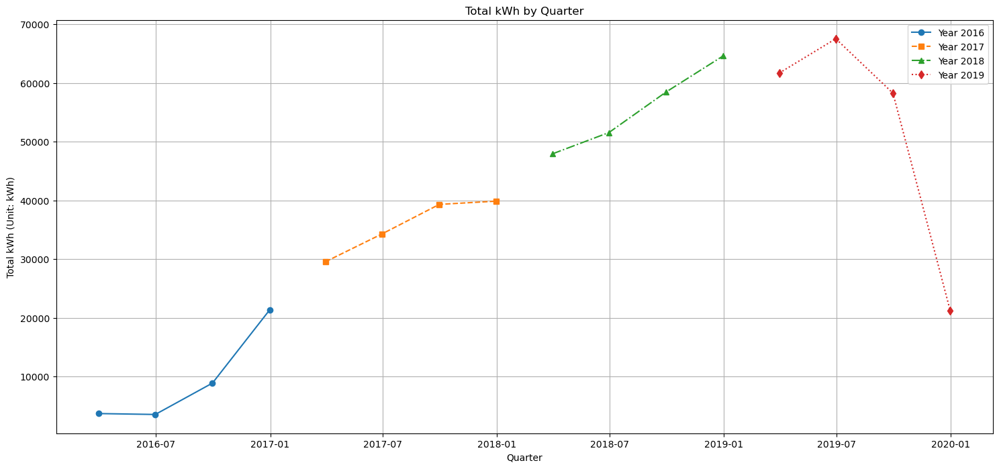

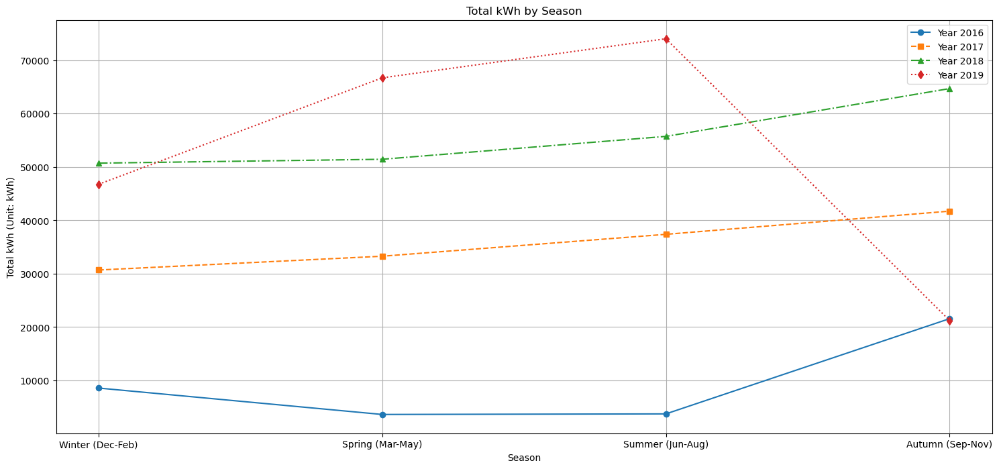

In [54]:
df = data_encoded.copy()

def filter_data_by_years(df, start_year, end_year):
    '''Filters the DataFrame by a range of years.
    
    Parameters:
        df (DataFrame): The input DataFrame
        start_year (int): The start year for the filtering
        end_year (int): The end year for the filtering
    
    Returns:
        DataFrame: A DataFrame filtered by the specified year range
    '''
    return df[(df['year'] >= start_year) & (df['year'] <= end_year)]

def convert_charging_time_to_minutes(df):
    '''Converts the charging time to minutes.
    
    Parameters:
        df (DataFrame): The input DataFrame
        
    Returns:
        DataFrame: A DataFrame with a new column for charging time in minutes
    '''
    df['charging_time_minutes'] = df['charging_time'].dt.total_seconds() / 60
    return df


def group_data(df):
    '''Groups the DataFrame by various time intervals and sums up the "Total kWh".
    
    Parameters:
        df (DataFrame): The input DataFrame
    
    Returns:
        tuple: Four DataFrames grouped by weekday, week, month, and quarter respectively
    '''
    # This line of code groups the DataFrame df by year, month, and weekday.
    # This line of code groups the DataFrame df by year, month, and day. The agg() function then sums up the "Total kWh" for each group. This would help you analyze the day{-to-day consumption patterns.
    # Example: If you have data for January 1, 2016, with Total kWh as [2, 3, 4], then after this operation, you would get a single row with Total kWh as 9 for January 1, 2016.
    group_by_weekday = df.groupby(['year', 'weekday']).agg({'Total kWh': 'sum'}).reset_index()
    group_by_week = df.groupby(['year', 'week']).agg({'Total kWh': 'sum'}).reset_index()
    group_by_month = df.groupby(['year', 'month']).agg({'Total kWh': 'sum'}).reset_index()
    group_by_quarter = df.groupby(['year', pd.Grouper(key='Start DateTime', freq='Q')]).agg({'Total kWh': 'sum'}).reset_index()
    
    return group_by_weekday, group_by_week, group_by_month, group_by_quarter


def plot_data(title, xlabel, ylabel, df, grouped_df, group_var, xticks=None, custom_xticklabels=None):
    '''Plots the DataFrame.'''
    plt.figure(figsize=(18, 8))
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    styles = ['-', '--', '-.', ':']
    markers = ['o', 's', '^', 'd']
    
    for idx, year in enumerate(df['year'].unique()):
        data = grouped_df[grouped_df['year'] == year]
        plt.plot(data[group_var], data['Total kWh'], label=f"Year {year}", linestyle=styles[idx % len(styles)], marker=markers[idx % len(markers)])
    
    if xticks is not None:
        plt.xticks(xticks)
    elif custom_xticklabels:  # Add this line
        plt.xticks(ticks=grouped_df[group_var].unique(), labels=custom_xticklabels)  # Add this line
        
    plt.legend()
    plt.grid(True)
    plt.show()

def group_by_season(df):
    '''Groups the DataFrame by seasons.'''
    conditions = [
        df['month'].isin([12, 1, 2]),
        df['month'].isin([3, 4, 5]),
        df['month'].isin([6, 7, 8]),
        df['month'].isin([9, 10, 11])
    ]
    choices = ['Winter', 'Spring', 'Summer', 'Autumn']
    
    df['season'] = pd.Categorical(np.select(conditions, choices, default='Unknown'), categories=choices, ordered=True)
    return df.groupby(['year', 'season']).agg({'Total kWh': 'sum'}).reset_index()

def main(df):
    '''Main function to run all tasks.'''
    df = filter_data_by_years(df, 2016, 2019)
    df = convert_charging_time_to_minutes(df)
    group_by_weekday, group_by_week, group_by_month, group_by_quarter = group_data(df)

    for title, xlabel, group_df, group_var, xticks in [
            ("Total kWh by Weekday", "Weekday (0=Monday, 6=Sunday)", group_by_weekday, 'weekday', np.arange(0, 7, 1)),
            ("Total kWh by Week", "Week of Year", group_by_week, 'week', np.arange(1, 53, 4)),
            ("Total kWh by Month", "Month (1=January, 12=December)", group_by_month, 'month', np.arange(1, 13, 1)),
            ("Total kWh by Quarter", "Quarter", group_by_quarter, 'Start DateTime', None)
        ]:
        plot_data(title, xlabel, "Total kWh (Unit: kWh)", df, group_df, group_var, xticks)

    group_by_season_df = group_by_season(df)
    
    # Special handling for season plot
    custom_xticklabels = ["Winter (Dec-Feb)", "Spring (Mar-May)", "Summer (Jun-Aug)", "Autumn (Sep-Nov)"]
    plot_data("Total kWh by Season", "Season", "Total kWh (Unit: kWh)", df, group_by_season_df, 'season', custom_xticklabels=custom_xticklabels)

if __name__ == "__main__":
    # Assuming data_encoded is your DataFrame
    main(df)

Frequency vs Granularity
    
    Frequency: This term refers to how often data is collected or reported. In your case, the frequency is minutely, meaning data is collected every minute.

    Granularity: This term describes the level of detail in the data. Minutely data is highly granular because it provides a detailed view of each minute.

# Univariate time series behavior of energy consumption

### Time Analysis

#### Minutely

In the function decompose_time_series_minute, the parameter model='additive' indicates that the time series decomposition will be additive in nature. In an additive model, the observed time series is assumed to be the sum of the trend, seasonal, and residual components. Mathematically, this is expressed as:


Observed (original dataframe) = Trend + Seasonal + Residual

The parameter freq=1 specifies that the frequency of the seasonal component is 1. In this context, it means that each data point is considered one period.

The function uses these parameters to decompose the time series into its constituent parts: trend, seasonality, and residuals. These components are then plotted using the plot_decomposed_series function.

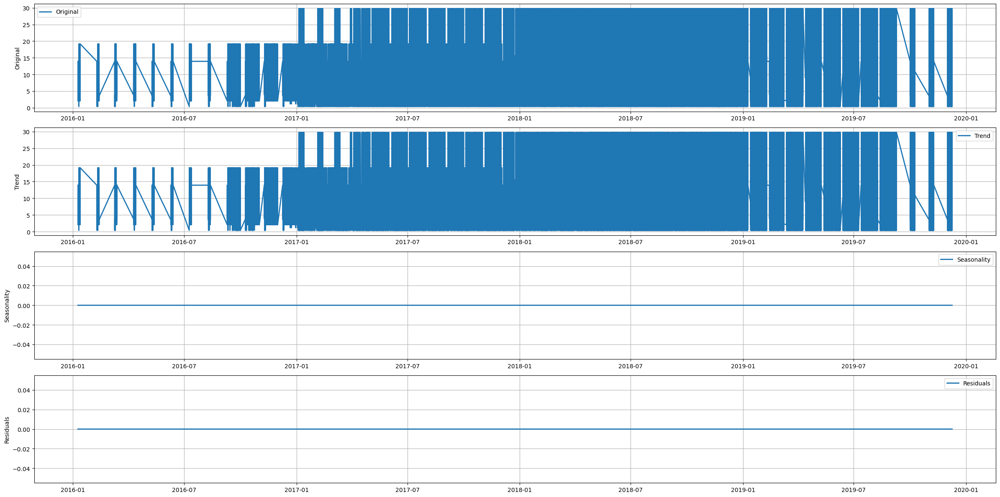

In [55]:
def plot_decomposed_series(df, result, column):
    """
    Plot the original time series and its decomposed components.
    """
    fig, axes = plt.subplots(4, 1, figsize=(24, 12))

    titles = ['Original', 'Trend', 'Seasonality', 'Residuals']
    y_values = [df[column], result.trend, result.seasonal, result.resid]

    for ax, title, y in zip(axes, titles, y_values):
        ax.plot(df['Start DateTime'], y, label=title, linewidth=2)
        ax.legend(loc='best')
        ax.set_ylabel(title)
        ax.grid(True)

    plt.tight_layout()
    plt.show()

def decompose_time_series_minute(df, column='Total kWh', model='additive', freq=1):
    """
    Decompose a time series into its components.
    """
    if column not in df.columns:
        raise ValueError(f"The column '{column}' does not exist in the DataFrame.")

    df = df.sort_values('Start DateTime')
    result = seasonal_decompose(df[column].dropna(), model=model, period=freq)

    plot_decomposed_series(df, result, column)

decompose_time_series_minute(df)

In [56]:
def decompose_time_series(df, column='Total kWh', model='additive', freq='D', period=None):
    if column not in df.columns:
        raise ValueError(f"The column '{column}' does not exist in the DataFrame.")
    
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("Index must be DatetimeIndex.")
        
    df_resampled = df.resample(freq).mean(numeric_only=True)

    # Optionally fill NaN values if they exist
    # You could use 'ffill', 'bfill' or interpolation methods like 'linear'
    # based on your data's characteristics
    df_resampled[column].fillna(method='ffill', inplace=True)

    ts_data = df_resampled[column].dropna()

    # Checking for NaN values again just to make sure
    if ts_data.isna().any():
        raise ValueError("Data contains NaN values that must be addressed before decomposition.")

    if not pd.infer_freq(ts_data.index):
        ts_data = ts_data.asfreq(freq)

    result = seasonal_decompose(ts_data, model=model, period=period)

    fig, axes = plt.subplots(4, 1, figsize=(20, 15))
    titles = ['Original', 'Trend', 'Seasonality', 'Residuals']
    y_values = [ts_data, result.trend, result.seasonal, result.resid]
    
    for ax, title, y in zip(axes, titles, y_values):
        ax.plot(ts_data.index, y, label=title)
        ax.legend(loc='best')
        ax.set_ylabel(title)
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

# Assuming your DataFrame is set with a DatetimeIndex
df.set_index('Start DateTime', inplace=True)
df.sort_index(inplace=True)

#### Hourly

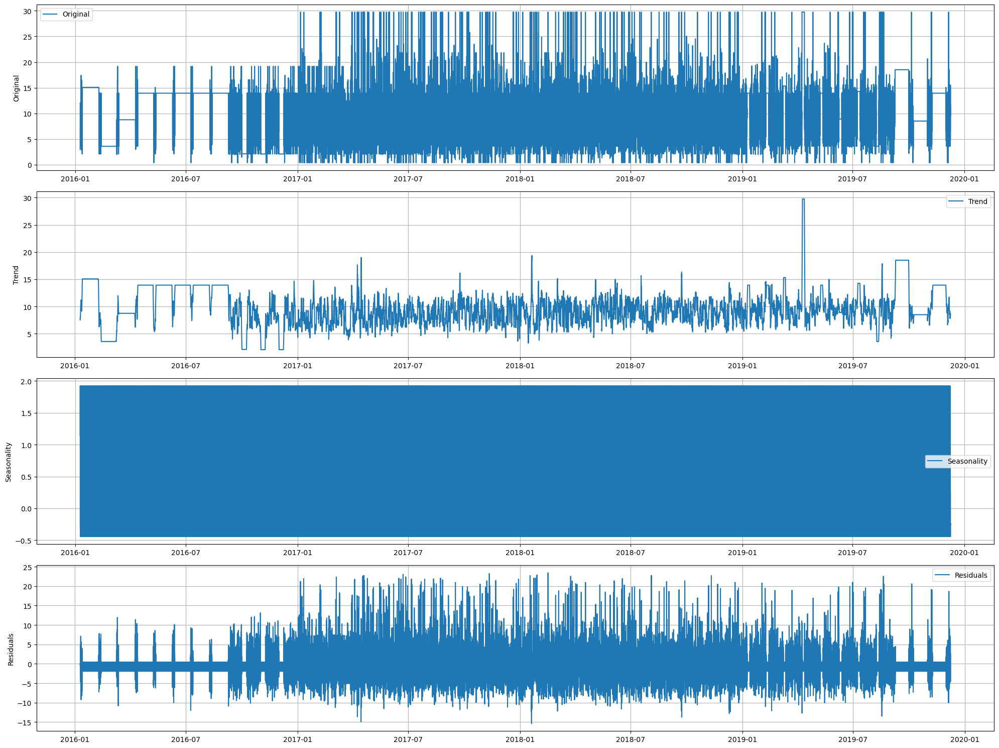

In [57]:
decompose_time_series(df, column='Total kWh', model='additive', freq='H', period=None)

#### Daily

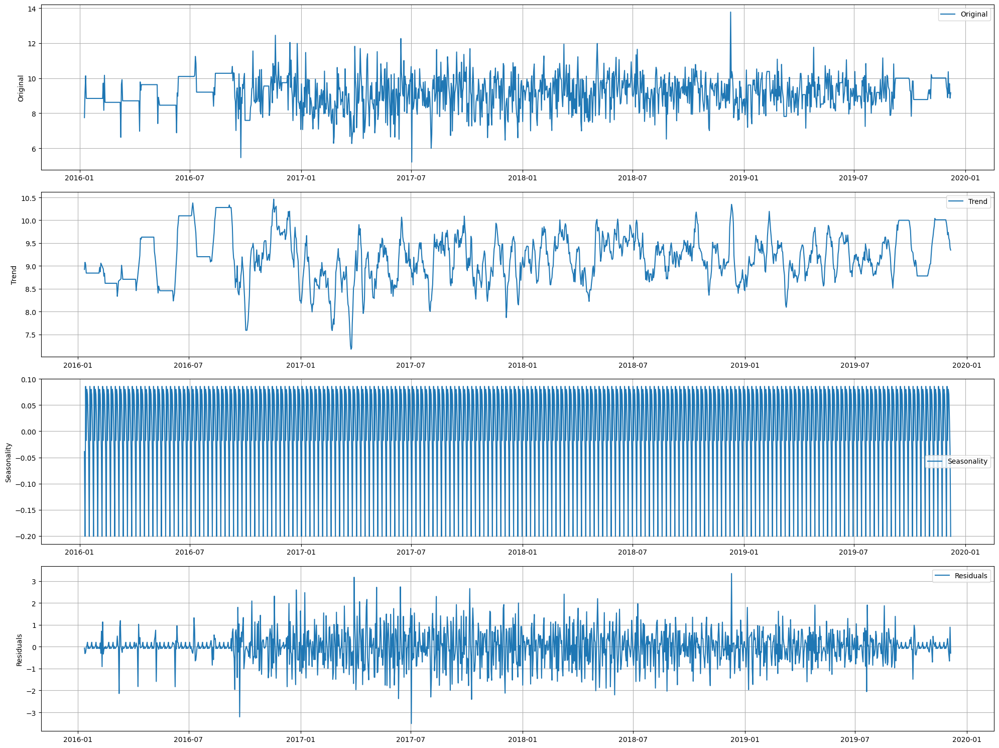

In [58]:
decompose_time_series(df, column='Total kWh', model='additive', freq='D', period=None)

#### Weekly

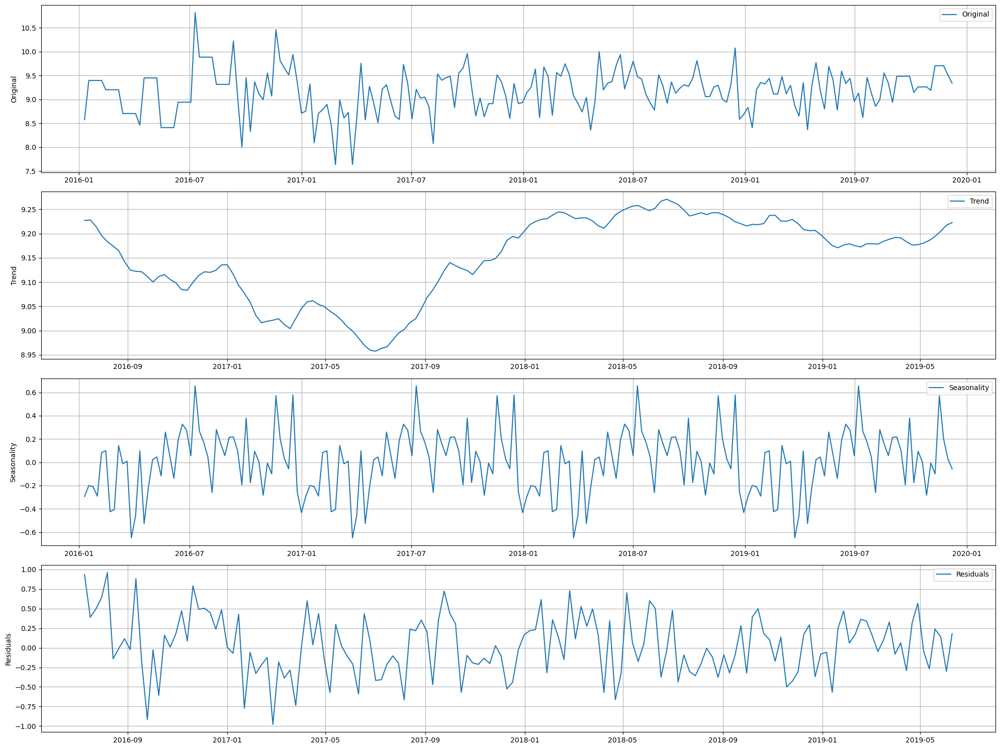

In [59]:
# Weekly decomposition
decompose_time_series(df, freq='W')

#### Monthly

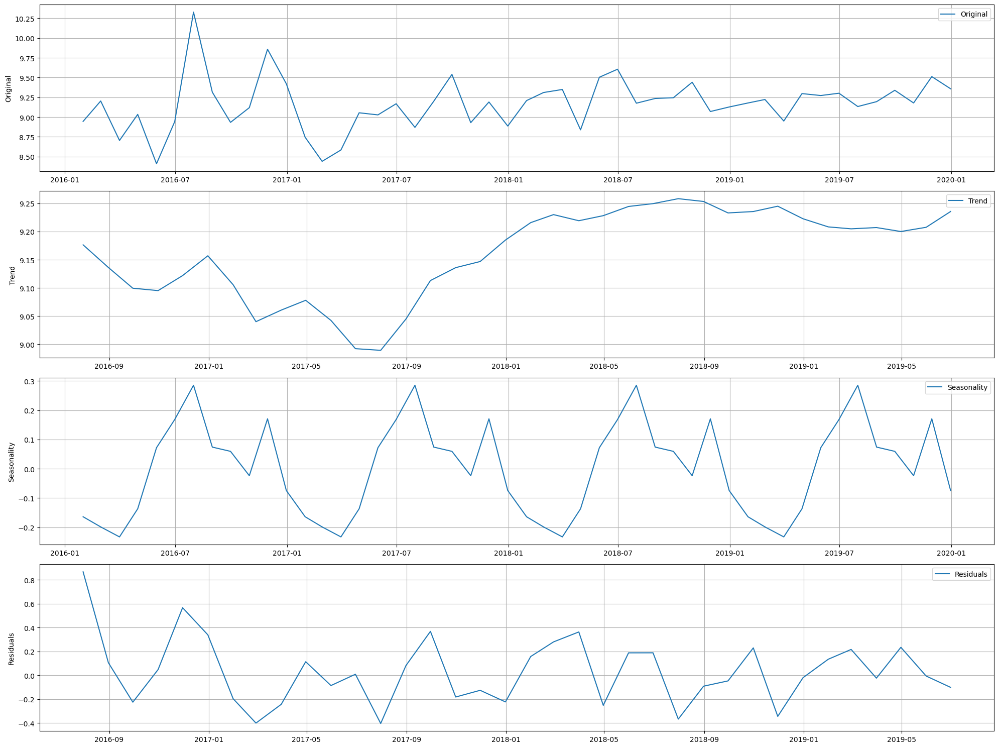

In [60]:
# Monthly decomposition
decompose_time_series(df, freq='M')

#### Quartley

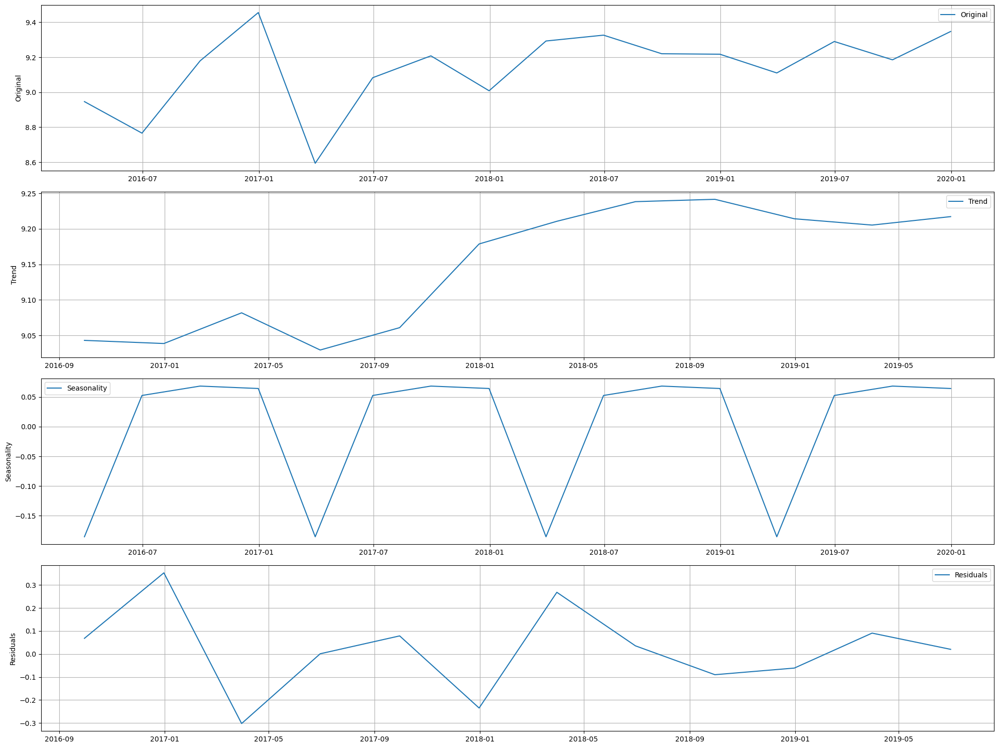

In [61]:
# Quarterly decomposition
decompose_time_series(df, freq='Q')

#### Yearly

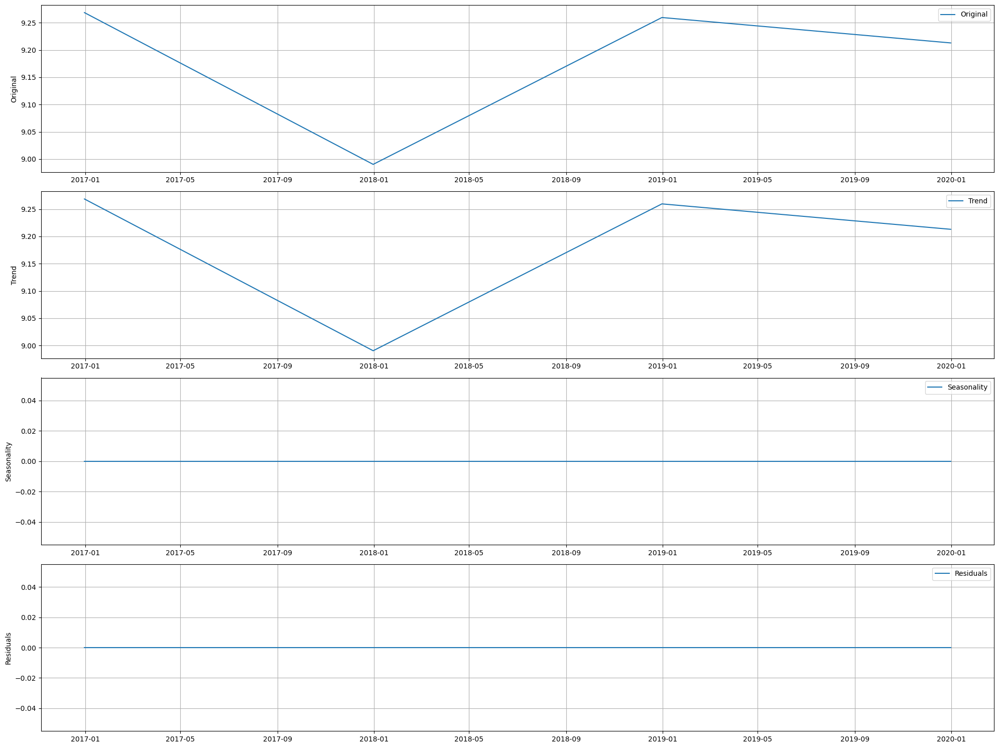

In [62]:
# Yearly decomposition
decompose_time_series(df, freq='Y')

We can appreciate that 

## Feature Engineering

Rolling Window vs Sliding Window
Rolling Window

    In the rolling window method, a fixed set of consecutive data points is selected for analysis. For example, if seven days of energy consumption data are being analyzed, the first window might include days 1 to 7, the second window days 8 to 14, and so on. No overlap between consecutive windows is observed.

Sliding Window

    In the sliding window approach, overlapping sets of data points are used. For instance, the first window might include days 1 to 7, the second window days 2 to 8, and so on. Overlap between consecutive windows is noted.

In [63]:
def create_sliding_window(df, column_name, window_width):
    # Extract the specific column data
    column_data = df[[column_name]]
    
    # Create a rolling window
    window = column_data.rolling(window=window_width)
    
    # Generate statistical features: min, median, and max
    new_features = pd.concat([window.min(), window.median(), window.max()], axis=1)
    
    # Rename the new feature columns
    new_features.columns = [f"{column_name}_min", f"{column_name}_median", f"{column_name}_max"]
    
    # Merge the new features with the original DataFrame
    new_dataframe = pd.concat([df, new_features], axis=1)
    
    return new_dataframe

# Example usage:
window_width = 4
df = create_sliding_window(df, "Total kWh", window_width)

In [64]:
df.head()

,End DateTime,charging_time,Connector,Total kWh,Site_encoded,Model_encoded,temp,feelslike,dew,humidity,precip,precipprob,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,fuel_station_count,fuel_station_avg_distance,parking_station_count,parking_station_avg_distance,busstation_station_count,busstation_station_avg_distance,trainstation_station_count,trainstation_station_avg_distance,mall_station_count,mall_station_avg_distance,supermarket_station_count,supermarket_station_avg_distance,restaurant_station_count,restaurant_station_avg_distance,hotel_station_count,hotel_station_avg_distance,school_station_count,school_station_avg_distance,university_station_count,university_station_avg_distance,cinema_station_count,cinema_station_avg_distance,theatre_station_count,theatre_station_avg_distance,year,month,week,weekday,x_encoded,y_encoded,Total kWh_min,Total kWh_median,Total kWh_max
Start DateTime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-09 07:21:00,2016-01-09 07:27:00,0 days 00:06:00,1,2.084,0.0,3.0,-1.4,-1.4,-1.4,99.90,0.0,0,0.0,2.00,54.0,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.383423,3118.0,1.393611,22.0,1.305582,0.0,0.0,4.0,0.823823,378.0,1.128516,1479.0,1.045938,1.0,1.167113,485.0,1.399964,9.0,1.504943,37.0,1.078417,45.0,1.055958,2016,1,1,5,-3.338015,56.591321,NaN,NaN,NaN
2016-01-09 07:51:00,2016-01-09 09:01:00,0 days 01:10:00,2,3.870,19.0,0.0,-1.4,-1.4,-1.4,99.90,0.0,0,0.0,2.00,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.150210,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.502910,37.0,1.135934,45.0,1.085529,2016,1,1,5,-3.738821,56.703423,NaN,NaN,NaN
2016-01-09 08:22:00,2016-01-09 14:32:00,0 days 06:10:00,1,13.930,3.0,0.0,-1.4,-1.4,-1.5,99.52,0.0,0,0.0,2.00,57.6,0.2,354,989.9,98.9,1.4,0.7,0.0,0,0.0,546.0,1.290386,3118.0,1.317919,22.0,1.201385,0.0,0.0,4.0,0.620780,378.0,1.025438,1479.0,0.936936,1.0,0.932436,485.0,1.288065,9.0,1.481638,37.0,0.969730,45.0,0.965783,2016,1,1,5,-3.477746,56.386610,NaN,NaN,NaN
2016-01-09 08:54:00,2016-01-09 16:37:00,0 days 07:43:00,2,3.870,19.0,0.0,-1.4,-1.4,-1.4,99.90,0.0,0,0.0,2.00,51.8,0.2,354,990.9,98.4,1.0,0.0,0.0,0,0.0,546.0,1.342559,3118.0,1.284324,22.0,1.278616,0.0,0.0,4.0,0.821164,378.0,1.150210,1479.0,1.110447,1.0,0.986283,485.0,1.349131,9.0,1.502910,37.0,1.135934,45.0,1.085529,2016,1,1,5,-3.738821,56.703423,2.084,3.87,13.93
2016-01-09 09:22:00,2016-01-09 09:37:00,0 days 00:15:00,2,3.580,13.0,3.0,-1.1,-1.1,-1.1,99.85,0.0,0,0.0,1.96,49.3,0.2,1,989.5,97.0,0.7,12.7,0.0,0,0.0,546.0,1.280573,3118.0,1.337606,22.0,1.187481,0.0,0.0,4.0,0.526177,378.0,0.990936,1479.0,0.872756,1.0,0.884343,485.0,1.268647,9.0,1.490317,37.0,0.913267,45.0,0.938228,2016,1,1,5,-3.432945,56.206728,3.580,3.87,13.93


In [65]:
def replace_nan_with_mean(df):
    return df.fillna(df.mean(numeric_only=True))

df = replace_nan_with_mean(df)

In [66]:
total_nan_count = df.isna().sum().sum()
total_nan_count

0

# Basic Solutions

## Example of Stationary and ACF

Stationarity and ACF

    If the ACF does not decay towards zero as the lags increase, it's often a sign that the series is non-stationary. In a stationary series, you'd expect the ACF to decay towards zero relatively quickly. The "100 lags" is not a strict rule but a heuristic; the key is to look for a decay towards zero.

Example
    
    Let's consider a simple example with Python code to generate a stationary and a non-stationary time series and their ACF plots:

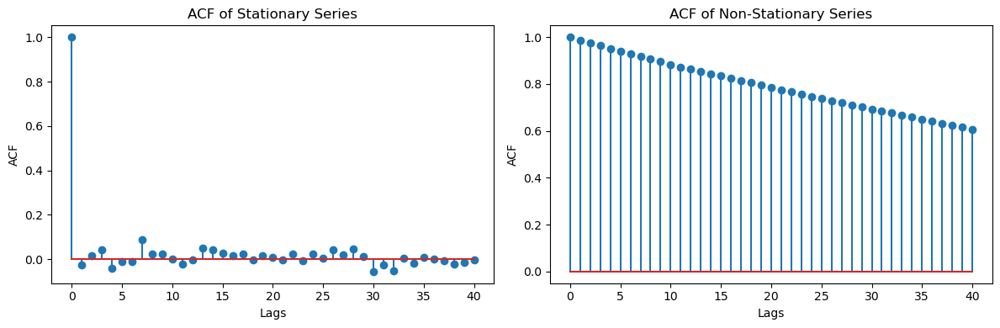

In [67]:
from statsmodels.tsa.stattools import acf

# Generate stationary time series
np.random.seed(0)
stationary_series = np.random.randn(1000)

# Generate non-stationary time series
non_stationary_series = np.cumsum(np.random.randn(1000))

# Calculate ACF
acf_stationary = acf(stationary_series, nlags=40)
acf_non_stationary = acf(non_stationary_series, nlags=40)

# Plot ACF
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].stem(acf_stationary)
axes[0].set_title('ACF of Stationary Series')
axes[0].set_xlabel('Lags')
axes[0].set_ylabel('ACF')

axes[1].stem(acf_non_stationary)
axes[1].set_title('ACF of Non-Stationary Series')
axes[1].set_xlabel('Lags')
axes[1].set_ylabel('ACF')

plt.tight_layout()
plt.show()


#### Stationary vs Non-Stationary Series

Stationary Series
    
    In a stationary series, it is observed that statistical properties such as mean and variance remain constant over time. A classic example could be a wind turbine whose power output fluctuates around a stable average value, regardless of when it is measured.

Non-Stationary Series

    In contrast, in a non-stationary series, these statistical properties are seen to change over time. An example might be the annual energy production from a solar farm, which increases year over year.

ACF and Its Relationship to Stationarity

Stationary Series
 
    In a stationary series, a rapid decay towards zero is exhibited by the Autocorrelation Function (ACF). This indicates that little to no correlation exists between the current data point and its past values.

Non-Stationary Series

    In a non-stationary series, a slow decay in the ACF is often observed, suggesting that the series has a "memory" of its past.

Why Stationarity is Often Required
 
    The requirement for stationarity in most predictive models is rooted in the mathematical assumptions behind these models. In stationary data, the relationships between variables do not change over time, making it easier to model and predict future values.

The Paradox of Learning from the Past
    
    It might seem contradictory to say that models need stationary data, implying that the past doesn't influence the future, while also expecting models to "learn" from past data. The key is that while models do learn from the past, what they learn is a stable relationship that holds over time, not a relationship that changes. In a non-stationary series, the relationship itself changes over time, making it difficult for a model to make accurate future predictions based on past behavior.

In [68]:
df.shape

(66664, 57)

In [69]:
def create_total_kwh_dataset(df):
    # Create a new DataFrame containing only the 'Total kWh' column
    total_kwh_df = df[['Total kWh']].copy()
    return total_kwh_df

# Create the new DataFrame
total_kwh_df = create_total_kwh_dataset(df)

# Lag Plot
def plot_lag():
    plt.figure()
    lag_plot(total_kwh_df['Total kWh'])
    mpl.rcParams['figure.figsize'] = [8.0, 8.0]
    plt.show()

# Autocorrelation Plot
def plot_autocorrelation():
    plt.figure()
    autocorrelation_plot(total_kwh_df['Total kWh'])
    mpl.rcParams['figure.figsize'] = [8.0, 8.0]
    plt.show()

# Zoomed Autocorrelation Plot
def plot_autocorrelation_zoom(start_date, end_date):
    data_subset = total_kwh_df['Total kWh'][start_date:end_date]
    autocorrelation_plot(data_subset)
    mpl.rcParams['figure.figsize'] = [12.0, 6.0]
    plt.show()

# ACF Plot using Statsmodels
def plot_acf_statsmodels():
    plt.figure()
    plot_acf(total_kwh_df['Total kWh'])
    plt.show()

# PACF Plot using Statsmodels
def plot_pacf_statsmodels(lags=25):
    plot_pacf(total_kwh_df['Total kWh'], lags=lags)
    mpl.rcParams['figure.figsize'] = [12.0, 6.0]
    plt.show()


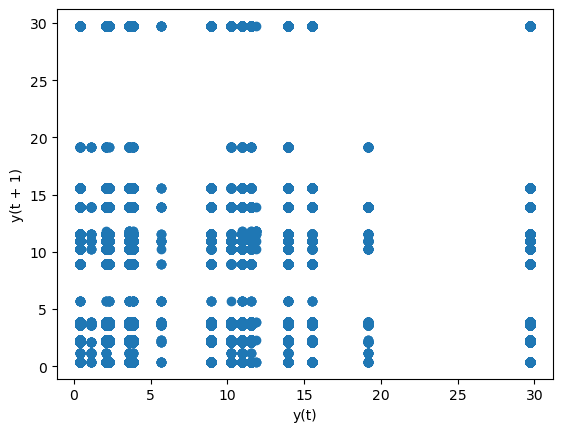

In [70]:
plot_lag()

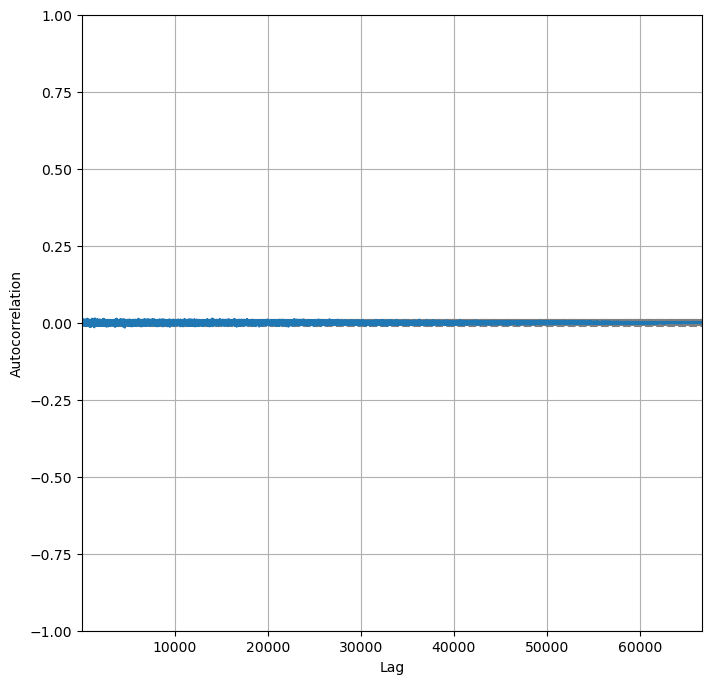

In [71]:
plot_autocorrelation()

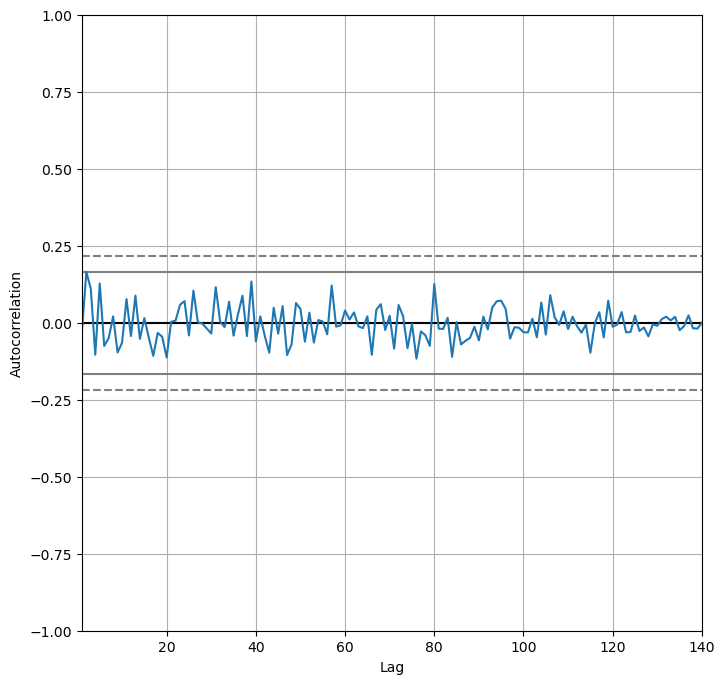

In [72]:
plot_autocorrelation_zoom('2016-01-09', '2016-01-16')  

<Figure size 1200x600 with 0 Axes>

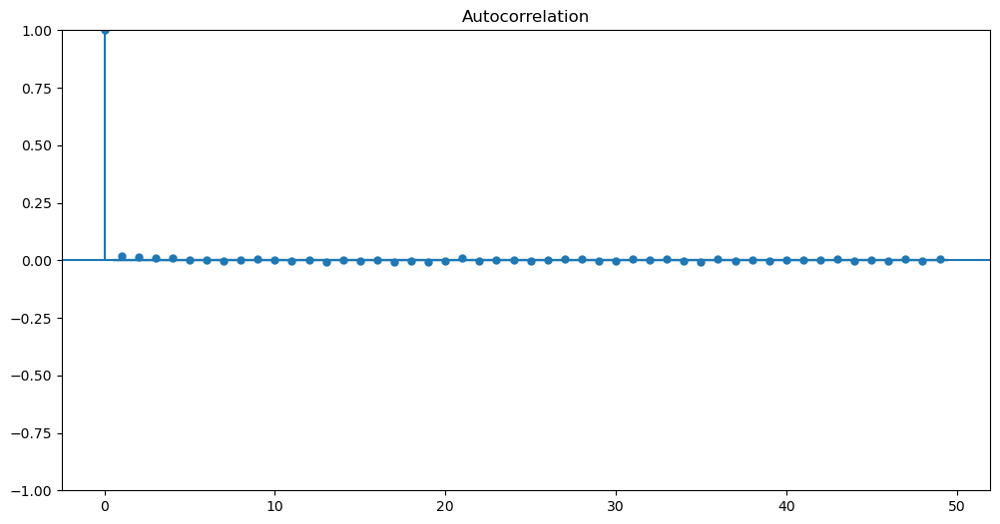

In [73]:
plot_acf_statsmodels()

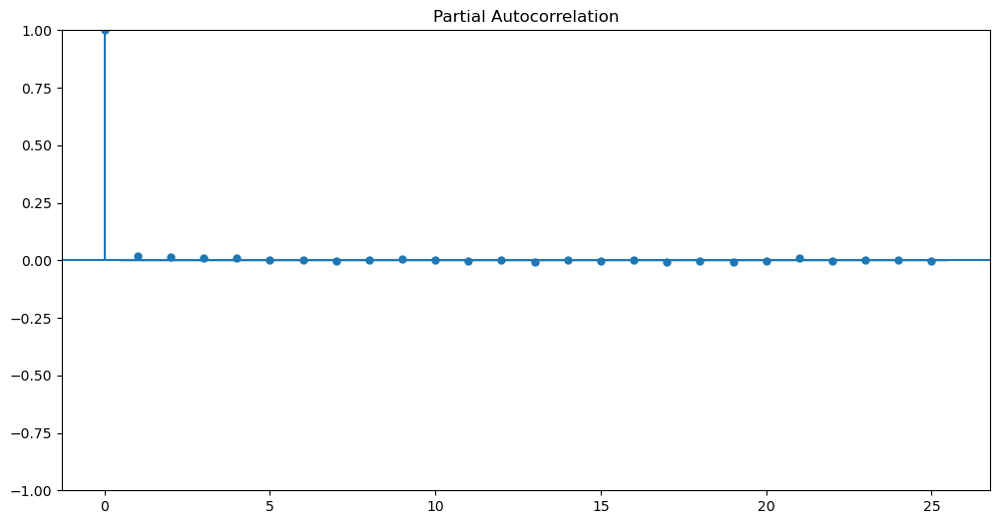

In [74]:
plot_pacf_statsmodels()

Sparse Lag Plot: 

    When the lag plot appears sparse, it is generally understood that a strong temporal correlation may be lacking in the data. This means that knowing the value at one point in time might not help much in predicting the next value. For example, if you're looking at daily temperatures and today is hot, a sparse lag plot would suggest that knowing today's temperature doesn't tell you much about what tomorrow's temperature will be.

ACF Plot: 

    When the ACF plot starts at 1 and drops abruptly to zero, it is often interpreted as an indication that the series may not have a significant autocorrelation structure. This is a characteristic commonly seen in stationary time series. In a stationary series, things like the average temperature or the amount of rainfall don't change much over time.

Interpretation:
    
Stationarity: 

    The abrupt drop in the ACF plot is often taken as a sign that the series might be stationary. Stationarity is a desirable property for many time series modeling techniques.

Predictability: 

    The sparseness of the lag plot is often taken to mean that simple lagged variables, like yesterday's temperature, might not be useful for predicting today's temperature. More complex methods or features might be needed.

Defining the Horizon

    Given the granularity of your data, both weekly and hourly horizons could be useful, but they serve different purposes:

    Weekly Horizon: Useful for long-term planning and understanding broader trends.
    Hourly Horizon: More appropriate for short-term predictions and operational adjustments.
    
Interpretation of SARIMA Components

    S --> Daily Seasonality: A daily repeating pattern in the data is indicated. For example, energy consumption might be higher during daytime and lower at night every day.

    I --> diff --> 1: A single differencing step is applied to make the data stationary. This means that the difference between consecutive data points is calculated.

    AR --> pacf --> 3: Three previous data points are considered significant for predicting the current value, as suggested by the Partial Autocorrelation Function (PACF).

    MA --> acf --> 6: Six past error terms are included in the model, as indicated by the Autocorrelation Function (ACF).

In [75]:
from pandas import Timestamp
import pandas as pd
import numpy as np
import itertools
from sklearn.preprocessing import StandardScaler

def get_index_by_date(df, date_str):
    date_str = Timestamp(date_str)
    indices = df.index[df.index == date_str]
    print(f"Indices found: {indices}")
    print(f"Checking for date: {date_str}")
    print(f"First few index values: {df.index[:5]}")  # Print first few index values
    print(f"Last few index values: {df.index[-5:]}")  # Print last few index values
    if indices.size > 0:
        return indices[0]
    else:
        print(f"Warning: Date {date_str} not found in DataFrame index.")
        return None

def create_rolling_features(df, window_width, columns_to_roll):
    window = df[columns_to_roll].rolling(window=window_width)
    median = window.median()
    std = window.std()
    new_df = pd.concat([median, std, df[columns_to_roll]], axis=1)
    
    # Create new column names
    col_names = []
    for col in columns_to_roll:
        col_names.extend([f"{col}_median", f"{col}_std"])
    col_names.extend(columns_to_roll)
    
    new_df.columns = col_names
    
    # Drop NaN rows
    new_df = new_df.dropna()
    
    # Concatenate additional columns
    additional_columns = [
        'charging_time', 'precip', 'month', 'week', 'weekday', 'x_encoded', 
        'y_encoded', 'Total kWh_min', 'Total kWh_median', 'Total kWh_max'
    ]
    new_df = pd.concat([new_df, df.loc[new_df.index, additional_columns]], axis=1)
    
    return new_df

def find_indices_for_split(df, train_ratio=0.7, val_ratio=0.15):
    total_len = len(df)
    first_index = df.index[0]
    last_index = df.index[-1]
    
    train_index = df.index[int(total_len * train_ratio)]
    val_index = df.index[int(total_len * (train_ratio + val_ratio))]
    
    return first_index, train_index, val_index, last_index

def get_index_position_by_date(df, date):
    try:
        return df.index.get_loc(date)
    except KeyError:
        return None

def create_time_series_data(df, start_date, end_date, window_width):
    '''The main goal of this function is to create time series data from a given dataframe for a 
    specific window width. It takes a dataframe (df), a start date (start date), an end date 
    (end_date), and a window width (window_width) as inputs. The function then 
    generates time series data where each row represents a window of time in the original 
    data, and the target variable is the value of 'Total kWh' at the end of that window. 
    The reason why the shape of the data increases from approximately 115 columns to 
    460 is due to the way the function constructs the time series data. For each row in the 
    output dataframe (data_x), it includes the values of all columns in the input dataframe 
    (df) for a certain number of previous time steps. This number of previous time steps is 
    defined by the window width parameter. 
    If window_width is 4 for example, and the input dataframe has 115 columns, then each 
    row in the output dataframe will contain the current values of all 115 columns, as well 
    as the values of all 115 columns for the previous 3 time steps. This results in a total of 
    4*115 = 460 columns in the output dataframe.
    Each of these 460 columns is given a unique name that reflects the original column 
    name and the time step it represents which is why the function creates a 
    col umn_names list of length 460. 
    This approach is often used in time series forecasting, where the goal is to use past 
    values of multiple variables to predict a future value of a target variable. '''
    start = get_index_position_by_date(df, start_date)
    end = get_index_position_by_date(df, end_date)
    
    if start is None or end is None:
        print("Start or end date not found. Skipping this iteration.")
        return None, None
    
    data_x, data_y = [], []
    column_names = []

    for i in range(start, end - window_width):
        data_x.append(df.iloc[i:i + window_width].to_numpy().ravel())
        data_y.append(df['Total kWh'].iloc[i + window_width])

    # Debugging Step 1: Check the Shape of data_x
    print("Shape of data_x:", np.vstack(data_x).shape)
    
    num_original_columns = df.shape[1]
    for j in range(1, window_width + 1):
        for col in df.columns:
            column_names.append(f"{col}_t_{j}")

    # Debugging Step 2: Check the Length of column_names
    print("Length of column_names:", len(column_names))
    
    # Debugging Step 3: Inspect column_names
    print("Column names:", column_names)

    data_x = pd.DataFrame(np.vstack(data_x), index=df.iloc[start + window_width:end].index)
    
    # Debugging Step 4: Inspect the Data
    print("First few rows of data_x:", data_x.head())
    
    try:
        data_x.columns = column_names
    except ValueError as e:
        print(f"Error setting column names: {e}")
        return None, None

    data_y = pd.Series(data_y, index=df.iloc[start + window_width:end].index)
    data_y.name = 'True Total kWh'

    return data_x, data_y

# Function to scale features
# Function to scale features
def scale_features(data_x, features_to_scale):
    # Create a copy to avoid SettingWithCopyWarning
    data_x = data_x.copy()

    # Convert Timedelta to seconds if it exists in features_to_scale
    for feature in features_to_scale:
        if np.issubdtype(data_x[feature].dtypes, np.timedelta64):
            data_x.loc[:, feature] = data_x[feature].dt.total_seconds()

    scaler = StandardScaler(copy=True)
    try:
        data_x.loc[:, features_to_scale] = scaler.fit_transform(data_x[features_to_scale])
    except Exception as e:
        print(f"Error in scaling features: {e}")
        return None, None

    return data_x, scaler


In [76]:
df_a = df.copy()
# Remove duplicate indices
df_a = df_a.loc[~df_a.index.duplicated(keep='first')]

# Create rolling features
window_width = 4
columns_to_roll = [
    'Total kWh', 'solarenergy', 'temp', 'humidity', 'windgust', 'windspeed', 
    'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation', 'uvindex', 
    'fuel_station_count', 'fuel_station_avg_distance', 'parking_station_count', 
    'parking_station_avg_distance', 'busstation_station_count', 'busstation_station_avg_distance', 
    'trainstation_station_count', 'trainstation_station_avg_distance', 'mall_station_count', 
    'mall_station_avg_distance', 'supermarket_station_count', 'supermarket_station_avg_distance', 
    'restaurant_station_count', 'restaurant_station_avg_distance', 'hotel_station_count', 
    'hotel_station_avg_distance', 'school_station_count', 'school_station_avg_distance', 
    'university_station_count', 'university_station_avg_distance', 'cinema_station_count', 
    'cinema_station_avg_distance', 'theatre_station_count', 'theatre_station_avg_distance'
]
new_dataframe = create_rolling_features(df_a, window_width, columns_to_roll)

In [77]:
import pandas as pd
import random

# Get unique dates from the dataframe
unique_dates = pd.Series(df_a.index.unique())

# Select a random start date
start_idx = random.choice(range(len(unique_dates)-2))  # subtract 2 to avoid index out of range
start_time = str(unique_dates[start_idx])

# Get the middle and end time as consecutive times
middle_time = str(unique_dates[start_idx + 1])
end_time = str(unique_dates[start_idx + 2])

print("Start Time: ", start_time)
print("Middle Time: ", middle_time)
print("End Time: ", end_time)


Start Time:  2019-01-20 17:50:00
Middle Time:  2019-01-20 17:59:00
End Time:  2019-01-20 18:07:00


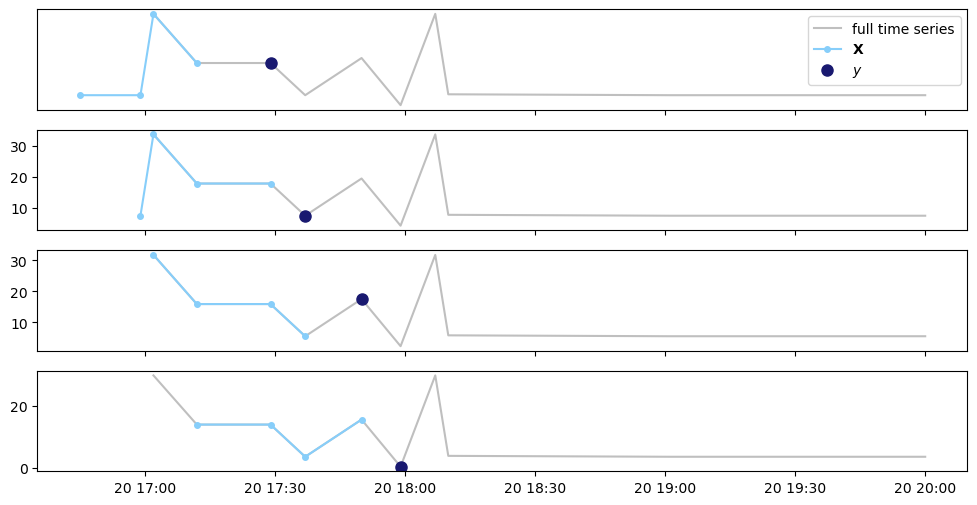

In [78]:
import matplotlib.pyplot as plt
import numpy as np

def plot_sliding_interval(df, start_time, middle_time, end_time, window, column='Total kWh'):
    # Define colors dictionary
    colors = {'lightskyblue': '#87CEFA', 'midnightblue': '#191970'}
    
    # Find the indices as integers for time subtraction
    start = np.where(df.index == start_time)[0][0] - window
    middle = np.where(df.index == middle_time)[0][0]
    end = np.where(df.index == end_time)[0][0] + window
    
    # Create subplot
    fig, ax = plt.subplots(nrows=4, sharex=True)
    
    # Plot sliding interval
    for i in range(4):
        full = df.iloc[start:end][column]
        train = df.iloc[middle - i - window:middle - i][column]
        predict = df.iloc[middle - i:middle - i + 1][column]
        
        ax[3-i].plot((full + 2*i), c='grey', alpha=0.5)
        ax[3-i].plot((train + 2*i), c=colors['lightskyblue'], markersize=4, marker='o')
        ax[3-i].plot((predict + 2*i), c=colors['midnightblue'], markersize=8, marker='o', linestyle='')
    
    ax[0].get_yaxis().set_ticks([])
    ax[0].legend(['full time series', '$\mathbf{X}$', '$y$'], bbox_to_anchor=(1, 1))
    
    plt.show()

# Usage
plot_sliding_interval(new_dataframe, start_time, middle_time, end_time, 4)

In [79]:
# Find indices for split
first_index, train_index, val_index, last_index = find_indices_for_split(new_dataframe)
print(f"First index: {first_index}")
print(f"Train index: {train_index}")
print(f"Validation index: {val_index}")
print(f"Last index: {last_index}")

# Create time series data
data_x, data_y = create_time_series_data(new_dataframe, first_index, last_index, window_width)

First index: 2016-01-09 08:54:00
Train index: 2019-02-02 13:08:00
Validation index: 2019-06-14 12:20:00
Last index: 2019-12-08 22:45:00


Shape of data_x: (63945, 460)
Length of column_names: 460
Column names: ['Total kWh_median_t_1', 'Total kWh_std_t_1', 'solarenergy_median_t_1', 'solarenergy_std_t_1', 'temp_median_t_1', 'temp_std_t_1', 'humidity_median_t_1', 'humidity_std_t_1', 'windgust_median_t_1', 'windgust_std_t_1', 'windspeed_median_t_1', 'windspeed_std_t_1', 'sealevelpressure_median_t_1', 'sealevelpressure_std_t_1', 'cloudcover_median_t_1', 'cloudcover_std_t_1', 'visibility_median_t_1', 'visibility_std_t_1', 'solarradiation_median_t_1', 'solarradiation_std_t_1', 'uvindex_median_t_1', 'uvindex_std_t_1', 'fuel_station_count_median_t_1', 'fuel_station_count_std_t_1', 'fuel_station_avg_distance_median_t_1', 'fuel_station_avg_distance_std_t_1', 'parking_station_count_median_t_1', 'parking_station_count_std_t_1', 'parking_station_avg_distance_median_t_1', 'parking_station_avg_distance_std_t_1', 'busstation_station_count_median_t_1', 'busstation_station_count_std_t_1', 'busstation_station_avg_distance_median_t_1', 'buss

In [80]:
!pip install deap
!pip install tqdm
!pip install sklearn-genetic-opt

In [81]:
type(data_x)

pandas.core.frame.DataFrame

In [82]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
import sklearn_genetic as GA
import pandas as pd


def split_data(data_x, data_y, first_index, train_index, val_index, last_index):
    # Extracting training data between 'first_index' and 'train_index'
    x_train = data_x.loc[first_index:train_index]
    y_train = data_y.loc[first_index:train_index]
    
    # Using `pd.date_range` to find the next timestamp after 'train_index'
    # This ensures we don't overlap with the training data when slicing for validation data
    next_after_train_index = pd.date_range(start=train_index, periods=2, freq='T')[1]
    
    # Using `pd.date_range` to find the next timestamp after 'val_index'
    # This ensures we don't overlap with the validation data when slicing for test data
    next_after_val_index = pd.date_range(start=val_index, periods=2, freq='T')[1]
    
    # Extracting validation data between 'next_after_train_index' and 'val_index'
    x_val = data_x.loc[next_after_train_index:val_index]
    y_val = data_y.loc[next_after_train_index:val_index]
    
    # Extracting test data between 'next_after_val_index' and 'last_index'
    x_test = data_x.loc[next_after_val_index:last_index]
    y_test = data_y.loc[next_after_val_index:last_index]
    
    return x_train, y_train, x_val, y_val, x_test, y_test

x_train, y_train, x_val, y_val, x_test, y_test = split_data(data_x, data_y, first_index, train_index, val_index, last_index)

In [83]:
datasets = {
    'data_x': data_x,
    'data_y': data_y,
    'x_train': x_train,
    'y_train': y_train,
    'x_val': x_val,
    'y_val': y_val,
    'x_test': x_test,
    'y_test': y_test
}

for name, dataset in datasets.items():
    print(f"The shape of {name} is {dataset.shape}")

The shape of data_x is (63945, 460)
The shape of data_y is (63945,)
The shape of x_train is (44762, 460)
The shape of y_train is (44762,)
The shape of x_val is (9592, 460)
The shape of y_val is (9592,)
The shape of x_test is (9591, 460)
The shape of y_test is (9591,)


In [84]:
# Import necessary packages
from pandas.api.types import is_timedelta64_ns_dtype
import pandas as pd

# Step 1: Inspect DataTypes
print("Data Types for data_train:\n", x_train.dtypes)
print("Data Types for data_val:\n", x_val.dtypes)
print("Data Types for data_test:\n", x_test.dtypes)

Data Types for data_train:
 Total kWh_median_t_1      object
Total kWh_std_t_1         object
solarenergy_median_t_1    object
solarenergy_std_t_1       object
temp_median_t_1           object
                           ...  
x_encoded_t_4             object
y_encoded_t_4             object
Total kWh_min_t_4         object
Total kWh_median_t_4      object
Total kWh_max_t_4         object
Length: 460, dtype: object
Data Types for data_val:
 Total kWh_median_t_1      object
Total kWh_std_t_1         object
solarenergy_median_t_1    object
solarenergy_std_t_1       object
temp_median_t_1           object
                           ...  
x_encoded_t_4             object
y_encoded_t_4             object
Total kWh_min_t_4         object
Total kWh_median_t_4      object
Total kWh_max_t_4         object
Length: 460, dtype: object
Data Types for data_test:
 Total kWh_median_t_1      object
Total kWh_std_t_1         object
solarenergy_median_t_1    object
solarenergy_std_t_1       object
temp_me

In [85]:
def count_total_nans(dfs, names):
    nan_counts = {}
    for df, name in zip(dfs, names):
        total_nan = df.isna().sum().sum()
        nan_counts[name] = total_nan
    return nan_counts

# Sample usage
dataframes = [x_train, y_train, x_val, y_val, x_test, y_test]
names = ['x_train', 'y_train', 'x_val', 'y_val', 'x_test', 'y_test']

result = count_total_nans(dataframes, names)
print("Total NaN counts for each DataFrame:", result)

Total NaN counts for each DataFrame: {'x_train': 0, 'y_train': 0, 'x_val': 0, 'y_val': 0, 'x_test': 0, 'y_test': 0}


In [86]:
# Step 2: Identify Object Columns
object_columns_train = x_train.select_dtypes(include=['object']).columns
object_columns_val = x_val.select_dtypes(include=['object']).columns
object_columns_test = x_test.select_dtypes(include=['object']).columns
print("Object Columns in data_train: ", object_columns_train)
print("Object Columns in data_val: ", object_columns_val)
print("Object Columns in data_test: ", object_columns_test)

Object Columns in data_train:  Index(['Total kWh_median_t_1', 'Total kWh_std_t_1', 'solarenergy_median_t_1',
       'solarenergy_std_t_1', 'temp_median_t_1', 'temp_std_t_1',
       'humidity_median_t_1', 'humidity_std_t_1', 'windgust_median_t_1',
       'windgust_std_t_1',
       ...
       'theatre_station_avg_distance_t_4', 'precip_t_4', 'month_t_4',
       'week_t_4', 'weekday_t_4', 'x_encoded_t_4', 'y_encoded_t_4',
       'Total kWh_min_t_4', 'Total kWh_median_t_4', 'Total kWh_max_t_4'],
      dtype='object', length=456)
Object Columns in data_val:  Index(['Total kWh_median_t_1', 'Total kWh_std_t_1', 'solarenergy_median_t_1',
       'solarenergy_std_t_1', 'temp_median_t_1', 'temp_std_t_1',
       'humidity_median_t_1', 'humidity_std_t_1', 'windgust_median_t_1',
       'windgust_std_t_1',
       ...
       'theatre_station_avg_distance_t_4', 'precip_t_4', 'month_t_4',
       'week_t_4', 'weekday_t_4', 'x_encoded_t_4', 'y_encoded_t_4',
       'Total kWh_min_t_4', 'Total kWh_median_t_

In [87]:
def convert_to_numeric(dfs):
    converted_dfs = []
    for df in dfs:
        converted_df = df.apply(pd.to_numeric, errors='coerce')
        converted_dfs.append(converted_df)
    return converted_dfs

# Sample usage
dataframes = [x_train, y_train, x_val, y_val, x_test, y_test]
converted_x_train, converted_y_train, converted_x_val, converted_y_val, converted_x_test, converted_y_test = convert_to_numeric(dataframes)

In [88]:
from pandas.api.types import is_timedelta64_ns_dtype
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Features to scale
features_to_scale = data_x.columns

def scale_dataframes(x_train, x_val, x_test):
    # Initialize the StandardScaler
    scaler = StandardScaler()
    
    # Fit and transform on the training data
    scaled_x_train = pd.DataFrame(scaler.fit_transform(x_train), columns=x_train.columns, index=x_train.index)
    
    # Transform the validation and test data using the fitted scaler
    scaled_x_val = pd.DataFrame(scaler.transform(x_val), columns=x_val.columns, index=x_val.index)
    scaled_x_test = pd.DataFrame(scaler.transform(x_test), columns=x_test.columns, index=x_test.index)
    
    return scaled_x_train, scaled_x_val, scaled_x_test

# Usage example:
scaled_x_train, scaled_x_val, scaled_x_test = scale_dataframes(converted_x_train, converted_x_val, converted_x_test)

In [89]:
def convert_series_to_dataframe(y_train, y_val, y_test):
    df_y_train = y_train.to_frame(name='y_train_column')
    df_y_val = y_val.to_frame(name='y_val_column')
    df_y_test = y_test.to_frame(name='y_test_column')
    
    return df_y_train, df_y_val, df_y_test

df_y_train, df_y_val, df_y_test = convert_series_to_dataframe(converted_y_train, converted_y_val, converted_y_test)


In [90]:
def check_dataframes(*dfs):
    for df in dfs:
        # Check for non-numeric types
        non_numeric_cols = df.select_dtypes(exclude=['number']).columns
        # Check for NaN values
        total_nans = df.isna().sum().sum()

        if len(non_numeric_cols) > 0 or total_nans > 0:
            print(f"DataFrame Alert: Contains {len(non_numeric_cols)} non-numeric columns or {total_nans} NaN values.")
        else:
            print("DataFrame OK: All numerical and no NaN values.")

# Usage example:
check_dataframes(scaled_x_train, df_y_train, scaled_x_val, df_y_val, scaled_x_test, df_y_test)


DataFrame OK: All numerical and no NaN values.
DataFrame OK: All numerical and no NaN values.
DataFrame OK: All numerical and no NaN values.
DataFrame OK: All numerical and no NaN values.
DataFrame OK: All numerical and no NaN values.
DataFrame OK: All numerical and no NaN values.


# Deeper Explanation 📚

## Table of Contents

1. [Estimator Initialization](#estimator-initialization)
2. [Flattening Target Data](#flattening-target-data)
3. [Genetic Algorithm Initialization](#genetic-algorithm-initialization)
4. [Model Fitting](#model-fitting)
5. [Feature Extraction](#feature-extraction)
6. [Applying Selected Features](#applying-selected-features)
7. [Model Evaluation](#model-evaluation)

---

### 1. Estimator Initialization 🛠️

```python
estimator = xgb.XGBRegressor(objective='reg:squarederror')
```

**What it does**: Initializes XGBoost as the estimator with the regression objective function.  
**Customization**: This can be customized based on the specific requirements of your project.

---

### 2. Flattening Target Data 📉

```python
y_train = y_train.values.ravel()
```

**What it does**: Flattens the target DataFrame to a 1D numpy array.  
**Why**: This ensures compatibility with scikit-learn's model interface.

---

### 3. Genetic Algorithm Initialization 🧬

**What it does**: Initializes the Genetic Algorithm (GA) with XGBoost as the estimator and a series of hyperparameters.

**Hyperparameters**:
- Population size
- Crossover probability
- Mutation probability
- Number of generations  

**Customization**: These are all tunable based on your problem requirements.

---

### 4. Model Fitting 🤖

```python
model = model.fit(x_train_scaled, y_train)
```

**What it does**: Fits the GA model to the scaled training data.  
**Why**: This performs feature selection based on the XGBoost model's performance in a 5-fold cross-validation setup.

---

### 5. Feature Extraction 🔍

```python
selected_features = x_train_scaled.columns[model.support_].tolist()
```

**What it does**: Extracts the names of the selected features after the GA process is complete.

---

### 6. Applying Selected Features 🎯

**What it does**: Applies the selected features to the training, validation, and test datasets.  
**Why**: This narrows down the feature set for each dataset to only those deemed important by the GA process.

---

### 7. Model Evaluation 📊

**What it does**: Evaluates the model using the selected features on the test dataset.  
**Metric**: Calculates the Mean Absolute Error (MAE) to evaluate the model's performance.

In [91]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error

# Import GAFeatureSelectionCV from your respective package
# from <YourPackage> import GAFeatureSelectionCV as GA

def select_features(x_train_scaled, y_train, x_val_scaled, y_val, x_test_scaled, y_test):
    """
    Feature Selection using Genetic Algorithm with XGBoost as the estimator.
    
    Parameters:
    - x_train_scaled: Scaled training features (DataFrame)
    - y_train: Training target values (DataFrame)
    - x_val_scaled: Scaled validation features (DataFrame)
    - y_val: Validation target values (DataFrame)
    - x_test_scaled: Scaled test features (DataFrame)
    - y_test: Test target values (DataFrame)
    
    Returns:
    - x_train_selected: Selected features from training set (DataFrame)
    - y_train: Unchanged training target values (array)
    - x_val_selected: Selected features from validation set (DataFrame)
    - y_val: Unchanged validation target values (array)
    - x_test_selected: Selected features from test set (DataFrame)
    - y_test: Unchanged test target values (array)
    - model: Trained GAFeatureSelectionCV model
    """
    
    # Initialize XGBoost as the estimator
    estimator = xgb.XGBRegressor(objective='reg:squarederror')
    
    # Flatten target arrays to 1D
    y_train = y_train.values.ravel()
    y_val = y_val.values.ravel()
    y_test = y_test.values.ravel()
    
    # Initialize the Genetic Algorithm model for feature selection
    model = GA.GAFeatureSelectionCV(estimator,
                                    cv=5,
                                    verbose=1,
                                    scoring="neg_mean_absolute_error",
                                    max_features=50,
                                    population_size=165,
                                    crossover_probability=0.5,
                                    mutation_probability=0.05,
                                    generations=20,
                                    n_jobs=-1)
    
    # Fit the GA model to the scaled training data
    model = model.fit(x_train_scaled, y_train)
    
    # Retrieve the features selected by the GA model
    selected_features = x_train_scaled.columns[model.support_].tolist()
    
    # Apply selected features to the training, validation, and test sets
    x_train_selected = x_train_scaled[selected_features]
    x_val_selected = x_val_scaled[selected_features]
    x_test_selected = x_test_scaled[selected_features]
    
    return x_train_selected, y_train, x_val_selected, y_val, x_test_selected, y_test, model

# Apply feature selection to your scaled data
x_train_selected, y_train_selected, x_val_selected, y_val_selected, x_test_selected, y_test_selected, model = select_features(scaled_x_train, df_y_train, scaled_x_val, df_y_val, scaled_x_test, df_y_test)

# Evaluate the model using the original test set
y_predict = model.predict(x_test_selected)
mae = mean_absolute_error(y_test_selected, y_predict)
print(f'MAE: {mae:.3f}')

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	165   	-44245.9	49664.3    	-6.07757   	-100000    
1  	191   	-13338.7	33991.4    	-6.08692   	-100000    


# Understanding Genetic Algorithm with XGBoost for Feature Selection

## What is an Estimator?

An "estimator" in machine learning is essentially a predictive model that you train using a set of features (`X`) to predict a target variable (`y`). In your case, XGBoost is used as the estimator. XGBoost is a gradient-boosted tree model that is highly efficient and effective for both regression and classification tasks.

### Role in Feature Selection:

1. **Objective Function**: The estimator provides an objective function for the GA. Essentially, the GA tries different combinations of features and uses the estimator to evaluate how good these combinations are at predicting the target variable. The evaluation metric is what you specify—in this case, "neg_mean_absolute_error."
  
2. **Evaluation**: The performance of a given feature subset is determined by fitting the estimator (XGBoost) to your training data restricted to that subset of features. The better the model performs according to the evaluation metric, the better the feature subset is considered to be.

---

## What is Genetic Algorithm (GA)?

A Genetic Algorithm is a search heuristic inspired by the process of natural evolution. The GA starts with a population of possible solutions—in this context, different combinations of features to include in the model.

### Role in Feature Selection:

1. **Initialization**: Random subsets of features are chosen in the beginning. Each such subset is called a "chromosome," and collectively, they form a "population."
  
2. **Selection**: Chromosomes are evaluated using the objective function (via the estimator, XGBoost in your case). The best-performing ones are selected to form a new generation.

3. **Crossover (Mating)**: Pairs of "parent" chromosomes from the selected subset are combined to create "child" chromosomes, introducing variety.
  
4. **Mutation**: Random changes are made to some of the child chromosomes to introduce even more variety and avoid local minima.
  
5. **Evolution**: Steps 2-4 are repeated for several generations, or until a stopping criterion is met.

---

## Putting It All Together

1. **Initialization**: The GA starts with a random population of feature subsets.
  
2. **Fitness Assessment**: Each feature subset (chromosome) is evaluated using XGBoost. It is trained on the training data restricted to the feature subset and evaluated on validation data. The mean absolute error is used to judge the "fitness" of each chromosome.
  
3. **Natural Selection**: The best-performing feature subsets are chosen.
  
4. **Evolution**: New generations are created through crossover and mutation operations.

5. **Stopping Criterion**: The algorithm runs for a fixed number of generations or until another stopping criterion is met.

6. **Result**: The feature subset that performed the best according to your evaluation metric is selected as the output of the algorithm.

By combining GA and XGBoost, you're essentially automating the feature selection process, aiming to find the subset of features that provides the best predictive performance. This is a powerful, albeit computationally intensive, approach to feature selection.


In [ ]:
def save_dataframes_as_csv(x_train, y_train, x_val, y_val, x_test, y_test, suffix='_4', directory='../data/interim/train'):
    # Check if the directory exists, if not create it
    if not os.path.exists(directory):
        os.makedirs(directory)

    # Save the dataframes as csv files with modified names
    x_train.to_csv(os.path.join(directory, f'x_train{suffix}.csv'), index=False)
    y_train.to_csv(os.path.join(directory, f'y_train{suffix}.csv'), index=False)
    x_val.to_csv(os.path.join(directory, f'x_val{suffix}.csv'), index=False)
    y_val.to_csv(os.path.join(directory, f'y_val{suffix}.csv'), index=False)
    x_test.to_csv(os.path.join(directory, f'x_test{suffix}.csv'), index=False)
    y_test.to_csv(os.path.join(directory, f'y_test{suffix}.csv'), index=False)

# Call the function
save_dataframes_as_csv(x_train_selected, y_train_selected, x_val_selected, y_val_selected, x_test_selected, y_test_selected)